# EDA Avancée - Analyse Textuelle Approfondie

**Objectif** : Analyse textuelle multi-colonnes avec améliorations suite aux recommandations.

**Sections** :
1. Setup et chargement des données
2. Distribution des tags (analyse conservée)
3. Détection de langue par colonne
4. Nuages de mots par colonne textuelle
5. Analyse des char n-grams (global + discriminants par tag)
6. Document texte unifié
7. Analyses LaTeX avancées
8. Synthèse et insights

**Tags prioritaires** : `math`, `graphs`, `strings`, `number theory`, `trees`, `geometry`, `games`, `probabilities`


## 1. Setup et Chargement des Données

Configuration de l'environnement et import des fonctions utilitaires.


In [83]:
# Auto-reload des modules (permet de modifier les fichiers .py sans redémarrer le kernel)
%load_ext autoreload
%autoreload 2

# Imports standards
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import json
import warnings
warnings.filterwarnings('ignore')

# Configuration des visualisations
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
%matplotlib inline

# Imports des fonctions utilitaires du projet
import sys
sys.path.append('../')

from src.utils.eda_helpers import (
    load_dataset, extract_tags_list, get_tag_statistics,
    get_priority_tag_coverage, PRIORITY_TAGS
)

from src.utils.text_analysis import (
    preprocess_text_full,
    detect_language_single,
    analyze_language_distribution,
    create_wordclouds_for_priority_tags,
    compare_top_words_by_tag,
    analyze_char_ngrams_global,
    analyze_char_ngrams_by_tag,
    create_unified_document
)

from src.utils.latex_helpers import (
    display_latex_text,
    display_latex_from_df,
    display_multiple_latex
)

from src.utils.translation_helpers import (
    detect_and_translate,
    translate_column,
    clean_notes_patterns,
    clean_column_patterns
)

from src.utils.advanced_eda import (
    normalize_text_for_duplicates,
    detect_near_duplicates,
    display_duplicate_examples,
    compute_lift_pmi,
    display_lift_pmi_analysis,
    plot_lift_heatmap,
    analyze_tag_distribution_detailed,
    display_tag_distribution_analysis
)

from src.utils.latex_analysis import (
    extract_all_latex_symbols,
    analyze_latex_enrichment_by_tag,
    print_tag_specific_symbols,
    plot_latex_enrichment_heatmap,
    compare_tags_latex_symbols,
    get_top_symbols_per_tag
)

from src.utils.numeric_analysis import (
    parse_time_limit,
    convert_time_limit_column,
    compute_text_length_stats,
    plot_numeric_distribution,
    plot_numeric_by_tag,
    print_numeric_stats_by_tag,
    plot_correlation_matrix
)

print("✅ Setup complet")
print(f"📌 Tags prioritaires : {PRIORITY_TAGS}")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
✅ Setup complet
📌 Tags prioritaires : ['math', 'graphs', 'strings', 'number theory', 'trees', 'geometry', 'games', 'probabilities']


In [3]:
# Chargement du dataset
DATA_DIR = '../data/raw/code_classification_dataset'
df = load_dataset(DATA_DIR)

print(f"Dataset chargé: {df.shape[0]} échantillons, {df.shape[1]} colonnes")
print(f"\nColonnes disponibles:")
for i, col in enumerate(df.columns, 1):
    print(f"  {i:2d}. {col}")

# Parser les tags
df = extract_tags_list(df)

print(f"\n✅ Données chargées et tags parsés")
df.head()


Loaded 4982 samples from ../data/raw/code_classification_dataset
Dataset chargé: 4982 échantillons, 21 colonnes

Colonnes disponibles:
   1. prob_desc_time_limit
   2. prob_desc_sample_outputs
   3. src_uid
   4. prob_desc_notes
   5. prob_desc_description
   6. prob_desc_output_spec
   7. prob_desc_input_spec
   8. prob_desc_output_to
   9. prob_desc_input_from
  10. lang
  11. lang_cluster
  12. difficulty
  13. file_name
  14. code_uid
  15. prob_desc_memory_limit
  16. prob_desc_sample_inputs
  17. exec_outcome
  18. source_code
  19. prob_desc_created_at
  20. tags
  21. hidden_unit_tests

✅ Données chargées et tags parsés


,prob_desc_time_limit,prob_desc_sample_outputs,src_uid,prob_desc_notes,prob_desc_description,prob_desc_output_spec,prob_desc_input_spec,prob_desc_output_to,prob_desc_input_from,lang,...,difficulty,file_name,code_uid,prob_desc_memory_limit,prob_desc_sample_inputs,exec_outcome,source_code,prob_desc_created_at,tags,hidden_unit_tests
0,2 seconds,"[""2\n2 4\n3 3\n3 1""]",591372383cf3624f69793c41370022de,None,"Numbers $$$1, 2, 3, \dots n$$$ (each integer f...","For each test case, in the first line, print t...",The first line contains one integer $$$t$$$ ($...,standard output,standard input,Python 3,...,1000.0,train_000.jsonl,88084dde61bbebdebe163309a2bda179,256 megabytes,"[""1\n4""]",PASSED,\ndef ii(): return int(input())\ndef mi(): ret...,1602407100,"[greedy, constructive algorithms, math, implem...",
1,3 seconds,"[""4\n10\n4\n0""]",afcd41492158e68095b01ff1e88c3dd4,"NoteIn the first test case of the example, the...","There are $$$n$$$ positive integers $$$a_1, a_...",For $$$t$$$ test cases print the answers in th...,The first line of the input contains one integ...,standard output,standard input,Python 3,...,1200.0,train_000.jsonl,df0e2ae03513f2b9280e19a1df6c8d84,256 megabytes,"[""4\n6\n40 6 40 3 20 1\n1\n1024\n4\n2 4 8 16\n...",PASSED,a = int(input())\nfor i in range(a):\n f = ...,1576321500,"[number theory, greedy]",
2,2 seconds,"[""5"", ""16"", ""18""]",e52ec2fa5bcf5d2027d57b0694b4e15a,NoteIn the first example it is possible to con...,You are given an undirected graph consisting o...,Print one integer — the minimum number of coin...,The first line contains two integers $$$n$$$ a...,standard output,standard input,Python 3,...,1900.0,train_000.jsonl,d045b0ecd6aaad78a2574780f55d22a1,256 megabytes,"[""3 2\n1 3 3\n2 3 5\n2 1 1"", ""4 0\n1 3 3 7"", ""...",PASSED,def read_nums():\n return [int(x) for x in ...,1545921300,"[dsu, greedy, graphs]",
3,1 second,"[""2\n5000 9\n1\n7 \n4\n800 70 6 9000 \n1\n1000...",cd2519f4a7888b2c292f05c64a9db13a,None,A positive (strictly greater than zero) intege...,Print $$$t$$$ answers to the test cases. Each ...,The first line contains an integer $$$t$$$ ($$...,standard output,standard input,PyPy 3,...,800.0,train_000.jsonl,52a2313fac7f87cb6696ab7b8e4dc447,256 megabytes,"[""5\n5009\n7\n9876\n10000\n10""]",PASSED,t = int(input())\nfor i in range(t):\n canP...,1590154500,"[implementation, math]",
4,1 second,"[""9"", ""14""]",d7fe15a027750c004e4f50175e1e20d2,None,"Polycarp is working on a new project called ""P...",Print a single number — answer to the problem.,Input file will contain not more than 100 comm...,standard output,standard input,Python 2,...,1000.0,train_005.jsonl,68e7ea5367d538b53e8e36e804665b20,64 megabytes,"[""+Mike\nMike:hello\n+Kate\n+Dmitry\n-Dmitry\n...",PASSED,import sys\nz=x=0\nfor s in sys.stdin:\n\tif s...,1269100800,[implementation],


In [78]:
print(df.query('difficulty.isna()').shape[0])
print(df.difficulty.value_counts())

print(df.query('prob_desc_time_limit.isna()').shape[0])
print(df.prob_desc_time_limit.value_counts())
df.prob_desc_time_limit.unique()

38
difficulty
 800.0     449
 1600.0    316
 1900.0    313
 1500.0    312
 1700.0    307
 1800.0    293
 2000.0    284
 1200.0    267
 1300.0    261
 1400.0    255
 2200.0    247
 2100.0    240
 1100.0    214
 2400.0    195
 1000.0    193
 2300.0    173
 900.0     167
 2500.0    138
 2600.0     93
 2700.0     71
 2800.0     45
 2900.0     23
 3000.0     22
-1.0        15
 3100.0     13
 3500.0     10
 3200.0     10
 3300.0      6
 3400.0      3
Name: count, dtype: int64
0
prob_desc_time_limit
2 seconds      2331
1 second       1910
3 seconds       363
4 seconds       144
1.5 seconds      52
5 seconds        52
2.5 seconds      25
6 seconds        20
0.5 seconds      19
2 секунды        11
3.5 seconds       8
0.5 second        6
10 seconds        6
1 секунда         6
7 seconds         5
4.5 seconds       5
8 seconds         4
15 seconds        2
2.0 s             1
6.5 seconds       1
3.0 s             1
9 seconds         1
Name: count, dtype: int64


array(['2 seconds', '3 seconds', '1 second', '0.5 seconds', '1.5 seconds',
       '4 seconds', '3.5 seconds', '5 seconds', '2.5 seconds',
       '15 seconds', '2.0 s', '1 секунда', '0.5 second', '6 seconds',
       '8 seconds', '2 секунды', '10 seconds', '7 seconds', '4.5 seconds',
       '6.5 seconds', '3.0 s', '9 seconds'], dtype=object)

## 2. Visualisation d'Exemples avec LaTeX

Affichage d'exemples de problèmes avec conservation de la mise en forme LaTeX.

**Objectif** : Comprendre visuellement le format des données et la présence de LaTeX.


In [81]:
# Choisir un échantillon à visualiser
idx = 16

print(f"{'='*100}")
print(f"VISUALISATION DE L'ÉCHANTILLON {idx}")
print(f"{'='*100}\n")

# Afficher les tags
print(f"🏷️  Tags : {df.loc[idx, 'tags']}\n")

# Afficher les différentes colonnes textuelles
display_latex_from_df(df, idx, column='prob_desc_description')
print()

display_latex_from_df(df, idx, column='prob_desc_input_spec')
print()

display_latex_from_df(df, idx, column='prob_desc_output_spec')
print()

display_latex_from_df(df, idx, column='prob_desc_notes')
print()

display_latex_from_df(df, idx, column='prob_desc_sample_inputs')
print()

display_latex_from_df(df, idx, column='prob_desc_sample_outputs')
print()

VISUALISATION DE L'ÉCHANTILLON 16

🏷️  Tags : ['graphs', 'constructive algorithms', 'data structures', 'dfs and similar', 'trees']

📄 Affichage de la ligne 16, colonne 'prob_desc_description':
────────────────────────────────────────────────────────────────────────────────


Evlampiy was gifted a rooted tree. The vertices of the tree are numbered from $1$ to $n$. Each of its vertices also has an integer $a_i$ written on it. For each vertex $i$, Evlampiy calculated $c_i$ — the number of vertices $j$ in the subtree of vertex $i$, such that $a_j &lt; a_i$. Illustration for the second example, the first integer is $a_i$ and the integer in parentheses is $c_i$After the new year, Evlampiy could not remember what his gift was! He remembers the tree and the values of $c_i$, but he completely forgot which integers $a_i$ were written on the vertices.Help him to restore initial integers!

────────────────────────────────────────────────────────────────────────────────

📄 Affichage de la ligne 16, colonne 'prob_desc_input_spec':
────────────────────────────────────────────────────────────────────────────────


The first line contains an integer $n$ $(1 \leq n \leq 2000)$ — the number of vertices in the tree. The next $n$ lines contain descriptions of vertices: the $i$-th line contains two integers $p_i$ and $c_i$ ($0 \leq p_i \leq n$; $0 \leq c_i \leq n-1$), where $p_i$ is the parent of vertex $i$ or $0$ if vertex $i$ is root, and $c_i$ is the number of vertices $j$ in the subtree of vertex $i$, such that $a_j &lt; a_i$. It is guaranteed that the values of $p_i$ describe a rooted tree with $n$ vertices.

────────────────────────────────────────────────────────────────────────────────

📄 Affichage de la ligne 16, colonne 'prob_desc_output_spec':
────────────────────────────────────────────────────────────────────────────────


If a solution exists, in the first line print "YES", and in the second line output $n$ integers $a_i$ $(1 \leq a_i \leq {10}^{9})$. If there are several solutions, output any of them. One can prove that if there is a solution, then there is also a solution in which all $a_i$ are between $1$ and $10^9$. If there are no solutions, print "NO".

────────────────────────────────────────────────────────────────────────────────

📄 Affichage de la ligne 16, colonne 'prob_desc_notes':
────────────────────────────────────────────────────────────────────────────────
⚠️ Texte vide ou None
────────────────────────────────────────────────────────────────────────────────

📄 Affichage de la ligne 16, colonne 'prob_desc_sample_inputs':
────────────────────────────────────────────────────────────────────────────────


["3\n2 0\n0 2\n2 0", "5\n0 1\n1 3\n2 1\n3 0\n2 0"]

────────────────────────────────────────────────────────────────────────────────

📄 Affichage de la ligne 16, colonne 'prob_desc_sample_outputs':
────────────────────────────────────────────────────────────────────────────────


["YES\n1 2 1", "YES\n2 3 2 1 2"]

────────────────────────────────────────────────────────────────────────────────



## 3. Distribution des Tags (Analyse Enrichie)

Analyse complète de la distribution des tags avec statistiques détaillées et co-occurrence avancée.

**Nouvelles analyses** :
- Distribution détaillée du nombre de tags par problème
- Analyse mono-tag vs multi-tag
- Co-occurrence avancée (Lift & PMI)
- Heatmap de co-occurrence

**Rappel** : Nous gardons **tous les 4,982 échantillons** (y compris ceux sans tags prioritaires) pour fournir des négatifs utiles au modèle.


### 3.1 Distribution Globale des Tags Prioritaires


DISTRIBUTION DES 8 TAGS PRIORITAIRES
          tag  count  frequency
         math   1409   0.282818
       graphs    542   0.108792
      strings    422   0.084705
number theory    350   0.070253
        trees    324   0.065034
     geometry    166   0.033320
        games    105   0.021076
probabilities     92   0.018466

✓ Couverture: 2678/4982 (53.8%)


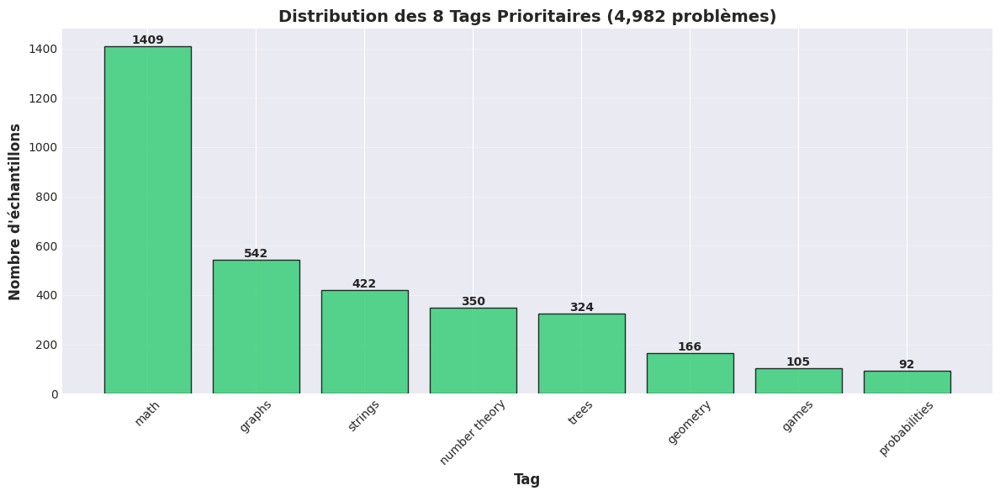


💡 Insight: Déséquilibre important entre 'math' (1409) et 'probabilities' (92) → Ratio 15:1


In [5]:
# Statistiques des tags prioritaires
tag_stats = get_tag_statistics(df)
priority_stats = tag_stats[tag_stats['is_priority']].copy()

print("=" * 80)
print("DISTRIBUTION DES 8 TAGS PRIORITAIRES")
print("=" * 80)
print(priority_stats[['tag', 'count', 'frequency']].to_string(index=False))

# Couverture
coverage = get_priority_tag_coverage(df)
print(f"\n✓ Couverture: {coverage['samples_with_priority_tag']}/{coverage['total_samples']} ({coverage['coverage_percentage']:.1f}%)")

# Visualisation
fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.bar(priority_stats['tag'], priority_stats['count'], color='#2ecc71', alpha=0.8, edgecolor='black')

# Ajouter les valeurs sur les barres
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{int(height)}',
            ha='center', va='bottom', fontsize=10, fontweight='bold')

ax.set_xlabel('Tag', fontsize=12, fontweight='bold')
ax.set_ylabel('Nombre d\'échantillons', fontsize=12, fontweight='bold')
ax.set_title('Distribution des 8 Tags Prioritaires (4,982 problèmes)', fontsize=14, fontweight='bold')
ax.tick_params(axis='x', rotation=45)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print("\n💡 Insight: Déséquilibre important entre 'math' (1409) et 'probabilities' (92) → Ratio 15:1")


### 3.2 Analyse Détaillée de la Distribution des Tags


In [6]:
# Analyse détaillée de la distribution
dist_stats = analyze_tag_distribution_detailed(df, tags_column='tags', priority_tags=PRIORITY_TAGS)

# Affichage formaté
display_tag_distribution_analysis(dist_stats)


ANALYSE DÉTAILLÉE DE LA DISTRIBUTION DES TAGS

📊 Vue d'ensemble:
   Nombre total d'échantillons: 4982
   Nombre de tags uniques: 37

📈 Distribution du nombre de tags par problème (tous problèmes):
   Min:    0
   Max:    11
   Mean:   2.80
   Median: 3.0
   Std:    1.43

🎯 Problèmes avec au moins un tag prioritaire:
   2678/4982 (53.8%)

📈 Distribution du nombre de tags (problèmes avec tags prioritaires uniquement):
   Min:    1
   Max:    5
   Mean:   1.27
   Median: 1.0
   Std:    0.51

🏷️  Mono-tag vs Multi-tag (tous problèmes):
   Mono-tag:    857 (17.2%)
   Multi-tag:  4125 (82.8%)

🏷️  Mono-tag vs Multi-tag (problèmes avec tags prioritaires uniquement):
   Mono-tag:   2018 (75.4%)
   Multi-tag:   660 (24.6%)


### 3.3 Co-occurrence Avancée : Lift & PMI

**Lift** : Mesure l'association entre deux tags. Lift > 1 signifie que les tags apparaissent ensemble plus souvent que par hasard.

**PMI** (Pointwise Mutual Information) : log(Lift), mesure similaire mais sur échelle logarithmique.

**Formules** :
- Lift(A,B) = P(A,B) / (P(A) × P(B))
- PMI(A,B) = log(Lift(A,B))


In [7]:
# Calculer Lift et PMI pour les tags prioritaires
lift_pmi_df = compute_lift_pmi(df, tags_column='tags', priority_tags=PRIORITY_TAGS)

# Afficher l'analyse
display_lift_pmi_analysis(lift_pmi_df, top_n=10)


CO-OCCURRENCE AVANCÉE: LIFT & PMI

✓ Top 10 paires par Lift (association forte):
  Tag A              + Tag B                Lift    PMI   Count
  ------------------   ------------------   ────    ────  ─────
  graphs             + trees                 3.52    1.26    124
  math               + number theory         2.65    0.97    262
  math               + probabilities         1.73    0.55     45
  probabilities      + trees                 1.50    0.41      9
  number theory      + probabilities         1.39    0.33      9
  games              + trees                 1.32    0.28      9
  geometry           + math                  1.26    0.23     59
  games              + number theory         1.08    0.08      8
  games              + math                  0.98   -0.02     29
  games              + strings               0.67   -0.39      6

💡 Insight: Lift > 1 signifie association positive.
   graphs+trees (Lift=3.52) apparaissent ensemble 3.5x plus que par hasard!


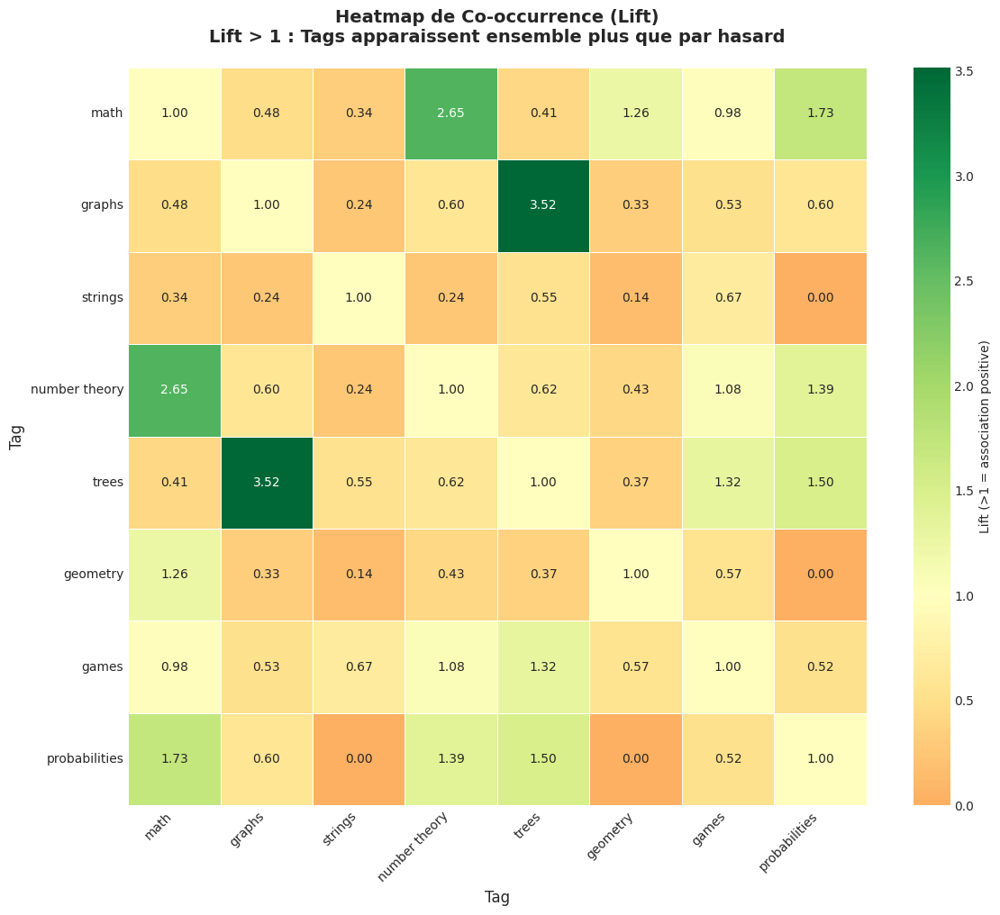


💡 Insight: Cette heatmap montre les associations fortes entre tags
   Exemple: Si 'graphs' et 'trees' ont un Lift élevé, ils apparaissent souvent ensemble


In [8]:
# Visualisation: Heatmap de co-occurrence (Lift)
plot_lift_heatmap(lift_pmi_df, priority_tags=PRIORITY_TAGS, figsize=(12, 10))

print("\n💡 Insight: Cette heatmap montre les associations fortes entre tags")
print("   Exemple: Si 'graphs' et 'trees' ont un Lift élevé, ils apparaissent souvent ensemble")


DISTRIBUTION DES 8 TAGS PRIORITAIRES
          tag  count  frequency
         math   1409   0.282818
       graphs    542   0.108792
      strings    422   0.084705
number theory    350   0.070253
        trees    324   0.065034
     geometry    166   0.033320
        games    105   0.021076
probabilities     92   0.018466

✓ Couverture: 2678/4982 (53.8%)


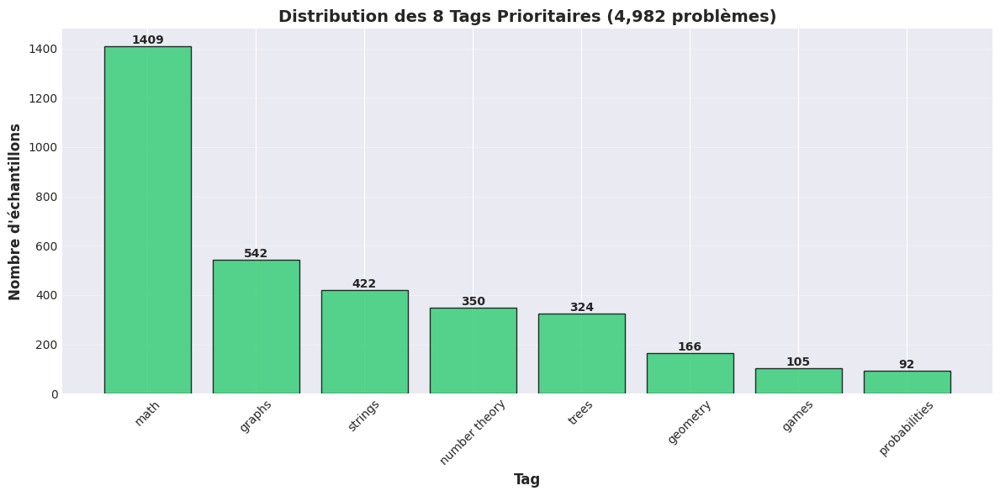


💡 Insight: Déséquilibre important entre 'math' (1409) et 'probabilities' (92) → Ratio 15:1


In [9]:
# Statistiques des tags prioritaires
tag_stats = get_tag_statistics(df)
priority_stats = tag_stats[tag_stats['is_priority']].copy()

print("=" * 80)
print("DISTRIBUTION DES 8 TAGS PRIORITAIRES")
print("=" * 80)
print(priority_stats[['tag', 'count', 'frequency']].to_string(index=False))

# Couverture
coverage = get_priority_tag_coverage(df)
print(f"\n✓ Couverture: {coverage['samples_with_priority_tag']}/{coverage['total_samples']} ({coverage['coverage_percentage']:.1f}%)")

# Visualisation
fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.bar(priority_stats['tag'], priority_stats['count'], color='#2ecc71', alpha=0.8, edgecolor='black')

# Ajouter les valeurs sur les barres
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{int(height)}',
            ha='center', va='bottom', fontsize=10, fontweight='bold')

ax.set_xlabel('Tag', fontsize=12, fontweight='bold')
ax.set_ylabel('Nombre d\'échantillons', fontsize=12, fontweight='bold')
ax.set_title('Distribution des 8 Tags Prioritaires (4,982 problèmes)', fontsize=14, fontweight='bold')
ax.tick_params(axis='x', rotation=45)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print("\n💡 Insight: Déséquilibre important entre 'math' (1409) et 'probabilities' (92) → Ratio 15:1")


## 3. Détection de Langue par Colonne

Analyse de la distribution des langues dans chaque colonne textuelle.

**Objectif** : Vérifier que le dataset est bien homogène en anglais et détecter d'éventuels outliers linguistiques.

**Note** : Nécessite `pip install langdetect` si pas déjà installé.


In [10]:
# Colonnes textuelles à analyser
text_columns = [
    'prob_desc_description',
    'prob_desc_input_spec',
    'prob_desc_output_spec',
    'prob_desc_notes'
]

print("=" * 100)
print("DÉTECTION DE LANGUE PAR COLONNE")
print("=" * 100)

lang_results = {}

for col in text_columns:
    print(f"\n{'='*100}")
    print(f"Colonne: {col}")
    print(f"{'='*100}")
    
    lang_dist = analyze_language_distribution(df, col)
    lang_results[col] = lang_dist
    
    print(f"\n📊 Résultats:")
    print(lang_dist.to_string(index=False))
    
    # Insight
    if len(lang_dist) > 0:
        main_lang = lang_dist.iloc[0]['language']
        main_pct = lang_dist.iloc[0]['percentage']
        print(f"\n💡 Langue dominante: {main_lang} ({main_pct}%)")

print("\n" + "="*100)
print("✅ ANALYSE LANGUE TERMINÉE")
print("="*100)


DÉTECTION DE LANGUE PAR COLONNE

Colonne: prob_desc_description
🔍 Détection de langue sur la colonne 'prob_desc_description'...
✅ Analyse terminée. 3 langues détectées.

📊 Résultats:
language  count  percentage
      en   4964       99.64
      ru     17        0.34
      ca      1        0.02

💡 Langue dominante: en (99.64%)

Colonne: prob_desc_input_spec
🔍 Détection de langue sur la colonne 'prob_desc_input_spec'...
✅ Analyse terminée. 5 langues détectées.

📊 Résultats:
language  count  percentage
      en   4923       98.82
 unknown     33        0.66
      ru     17        0.34
      fr      8        0.16
      af      1        0.02

💡 Langue dominante: en (98.82%)

Colonne: prob_desc_output_spec
🔍 Détection de langue sur la colonne 'prob_desc_output_spec'...
✅ Analyse terminée. 9 langues détectées.

📊 Résultats:
language  count  percentage
      en   4869       97.73
 unknown     85        1.71
      ru     17        0.34
      ca      3        0.06
      fr      3        0.06
   

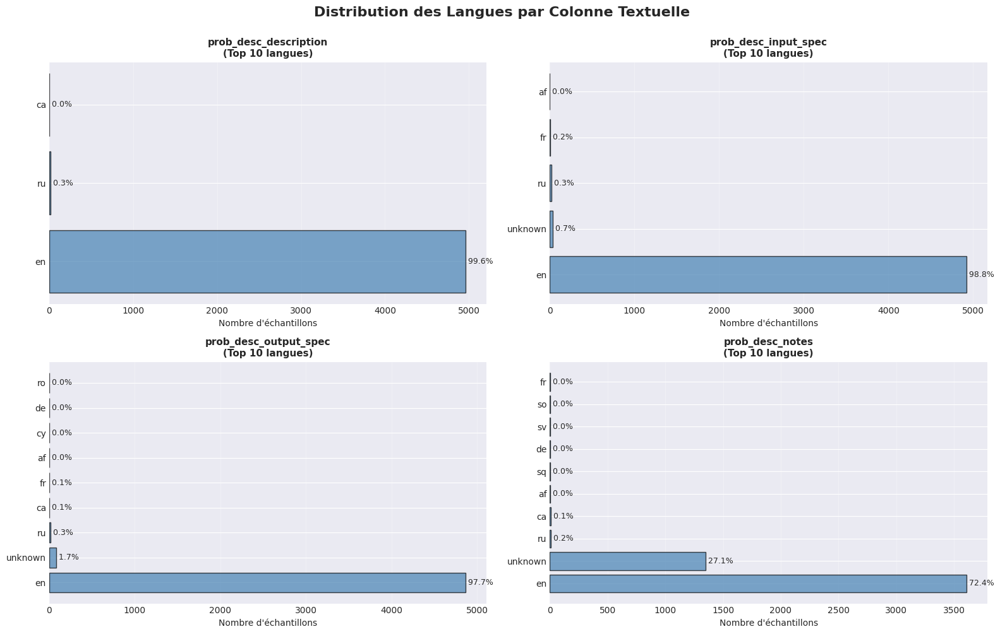

In [50]:
# Visualisation comparative
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
axes = axes.flatten()

for idx, col in enumerate(text_columns):
    ax = axes[idx]
    lang_dist = lang_results[col]
    
    if len(lang_dist) == 0:
        ax.text(0.5, 0.5, 'Aucune donnée', ha='center', va='center')
        ax.set_title(col, fontsize=12, fontweight='bold')
        continue
    
    # Top 10 langues
    top_langs = lang_dist.head(10)
    
    bars = ax.barh(top_langs['language'], top_langs['count'], color='steelblue', alpha=0.7, edgecolor='black')
    
    ax.set_xlabel('Nombre d\'échantillons', fontsize=10)
    ax.set_title(f'{col}\n(Top 10 langues)', fontsize=11, fontweight='bold')
    ax.grid(axis='x', alpha=0.3)
    
    # Ajouter les pourcentages
    for i, (bar, pct) in enumerate(zip(bars, top_langs['percentage'])):
        width = bar.get_width()
        ax.text(width, bar.get_y() + bar.get_height()/2.,
                f' {pct:.1f}%',
                ha='left', va='center', fontsize=9)

plt.suptitle('Distribution des Langues par Colonne Textuelle', fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()


### 4.2 Nettoyage des Patterns dans les Notes

Correction des patterns problématiques comme "NoteIN" → "Note: In"


In [57]:
def clean_notes_patterns(text: str) -> str:
    """
    Nettoie les patterns problématiques dans les notes.
    
    Corrige notamment :
    - "NoteIN" → "Note: In"
    - "NoteThe" → "Note: The"
    - "NoteFor" → "Note: For"
    - etc.
    
    Args:
        text (str): Texte à nettoyer
        
    Returns:
        str: Texte nettoyé
        
    Examples:
        >>> clean_notes_patterns("NoteIN the following example...")
        'Note: In the following example...'
        >>> clean_notes_patterns("NoteThe answer is...")
        'Note: The answer is...'
    """
    if pd.isna(text) or not isinstance(text, str):
        return text
    
    # Pattern principal: Note + mot commençant par majuscule
    # Remplacer par "Note: " + le mot
    text = re.sub(r'Note([A-Z][a-z]+)', r'Note: \1', text)
    
    return text

print(clean_notes_patterns('NoteIn je suis'))
print(clean_notes_patterns('Note: In je suis'))
print(clean_notes_patterns('NoteFor In je suis'))

Note: In je suis
Note: In je suis
Note: For In je suis


In [58]:
df["prob_desc_notes"] = df["prob_desc_notes"].apply(clean_notes_patterns)

In [60]:
df["prob_desc_notes"]

0                                                    None
1       Note: In the first test case of the example, t...
2       Note: In the first example it is possible to c...
3                                                    None
4                                                    None
                              ...                        
4977    Note: In the first test case to have an opport...
4978    Note: In the first example preprocess moves ar...
4979    Note: In the first test case, in the first mov...
4980    Note: In the first test case Nikolay may start...
4981    Note: In the first sample you can put a police...
Name: prob_desc_notes, Length: 4982, dtype: object

### 4.3 Traduction Automatique

Traduction des textes non-anglais vers l'anglais avec préservation du LaTeX.


In [34]:
!uv pip install deep-translator langdetect

Using Python 3.13.11 environment at: /app/.venv
Audited 2 packages in 39ms


In [35]:
from deep_translator import GoogleTranslator

translator = GoogleTranslator(source='auto', target='en')
result = translator.translate("Trouvez la somme de n nombres")
print(result)

Find the sum of n numbers


In [41]:
# Traduction des colonnes textuelles principales
# Note: Le LaTeX est préservé intact pendant la traduction

print("=" * 100)
print("TRADUCTION DES COLONNES TEXTUELLES")
print("=" * 100)

# Liste des colonnes à traduire
columns_to_translate = [
    'prob_desc_description',
    'prob_desc_input_spec',
    'prob_desc_output_spec',
    'prob_desc_notes'
]

# Traduire chaque colonne
for col in columns_to_translate:
    print(f"\n{'─'*100}")
    df = translate_column(
        df,
        column=col,
        target_lang='en',
        new_column='_translated'  # Crée col_translated
    )

print(f"\n{'='*100}")
print("✅ TOUTES LES TRADUCTIONS SONT TERMINÉES")
print("=" * 100)
print("\nColonnes traduites créées:")
for col in columns_to_translate:
    print(f"   ✓ {col}_translated")

TRADUCTION DES COLONNES TEXTUELLES

────────────────────────────────────────────────────────────────────────────────────────────────────
🌐 Traduction de la colonne 'prob_desc_description' → 'prob_desc_description_translated'...
   Langue cible: en

✅ Traduction terminée:
   📝 Traduit:     19 / 4982 (  0.4%)
   ✓  Original:  4963 / 4982 ( 99.6%)
   ❌ Erreur:       0 / 4982 (  0.0%)

────────────────────────────────────────────────────────────────────────────────────────────────────
🌐 Traduction de la colonne 'prob_desc_input_spec' → 'prob_desc_input_spec_translated'...
   Langue cible: en

✅ Traduction terminée:
   📝 Traduit:     31 / 4982 (  0.6%)
   ✓  Original:  4951 / 4982 ( 99.4%)
   ❌ Erreur:       0 / 4982 (  0.0%)

────────────────────────────────────────────────────────────────────────────────────────────────────
🌐 Traduction de la colonne 'prob_desc_output_spec' → 'prob_desc_output_spec_translated'...
   Langue cible: en

✅ Traduction terminée:
   📝 Traduit:     28 / 4982 (  0

### 4.4 Détection de Near-Duplicates

Détection des descriptions très similaires (après traduction) via hashing MD5 et normalisation agressive.

**Objectif** : Identifier les énoncés qui sont essentiellement les mêmes malgré de légères variations textuelles.

**Méthodologie** :
1. Normalisation agressive (suppression LaTeX, lowercase, uniquement lettres)
2. Hashing MD5 des textes normalisés
3. Identification des groupes de duplicates


In [42]:
# Détection des near-duplicates sur le texte traduit
dup_groups_df, df = detect_near_duplicates(
    df,
    column='prob_desc_description_translated',
    min_group_size=2
)


🔍 Détection de near-duplicates sur 'prob_desc_description_translated'...

📊 Résultats:
   Textes normalisés uniques: 4973/4982 (99.8%)
   ⚠️  9 groupes de near-duplicates détectés
   📝 18 échantillons concernés (0.4%)


In [63]:
dup_groups_df

,hash,count,indices,tags_variety
0,8682dafd752deaa595596f61294b7879,2,"[4236, 4238]",2
1,d0a2fb01e55f1d7785c06024f3b40c46,2,"[32, 2120]",1
2,06db4a522882886b7557893645229e1f,2,"[1837, 1852]",1
3,8b02b4b43581a066f02b229f5af6d09a,2,"[4221, 4228]",2
4,57a308bc742f8652b68081c7630f206e,2,"[4104, 4106]",2
5,2e8fecd3ace7d9e4a7bc5d50ce6e79b3,2,"[141, 4834]",2
6,8c828d954bb455afefec6661fc12a783,2,"[3949, 3951]",2
7,845c15b90b096fb97241497d18ea31e4,2,"[3406, 3407]",2
8,a991a4e57af246338f20fc96f0a0738c,2,"[4378, 4380]",1


In [43]:
# Afficher des exemples de near-duplicates
if len(dup_groups_df) > 0:
    display_duplicate_examples(
        df,
        dup_groups_df,
        column='prob_desc_description_translated',
        n_groups=3,
        max_text_length=400
    )
    
    print(f"\n{'='*100}")
    print("💡 INSIGHTS SUR LES NEAR-DUPLICATES")
    print(f"{'='*100}")
    print(f"📌 Ces duplicates peuvent causer du data leakage si répartis entre train/test")
    print(f"📌 Solution: Utiliser GroupSplit pour garder les duplicates dans le même fold")
    print(f"📌 Alternative: Ne garder qu'un seul exemplaire par groupe")
else:
    print("\n✅ Aucun near-duplicate détecté dans les descriptions traduites")



EXEMPLES DE NEAR-DUPLICATES (Top 3 groupes)

────────────────────────────────────────────────────────────────────────────────────────────────────
Groupe 1 : 2 échantillons similaires
────────────────────────────────────────────────────────────────────────────────────────────────────

   📄 Échantillon 4236:
      Tags: ['constructive algorithms', 'greedy']
      Texte: The difference between the versions is in the costs of operations. Solution for one version won't work for another!Alice has a grid of size $$$n \times m$$$, initially all its cells are colored white. The cell on the intersection of $$$i$$$-th row and $$$j$$$-th column is denoted as $$$(i, j)$$$. Alice can do the following operations with this grid:Choose any subrectangle containing cell $$$(1, 1)...

   📄 Échantillon 4238:
      Tags: ['constructive algorithms', 'flows', 'graph matchings', 'greedy']
      Texte: The difference between the versions is in the costs of operations. Solution for one version won't work for an

In [64]:
# Suppression des near-duplicates : ne garder qu'un exemplaire par groupe
print(f"\n{'='*100}")
print("SUPPRESSION DES NEAR-DUPLICATES")
print(f"{'='*100}")

n_before = len(df)
print(f"📊 Nombre d'échantillons avant suppression : {n_before}")

# La fonction detect_near_duplicates a ajouté une colonne {column}_hash
hash_column = 'prob_desc_description_translated_hash'

if hash_column in df.columns:
    # Identifier les hashes qui apparaissent plus d'une fois
    hash_counts = df[hash_column].value_counts()
    duplicate_hashes = hash_counts[hash_counts > 1].index
    
    # Séparer les duplicates des non-duplicates
    non_duplicates = df[~df[hash_column].isin(duplicate_hashes)].copy()
    duplicates = df[df[hash_column].isin(duplicate_hashes)].copy()
    
    print(f"   Non-duplicates : {len(non_duplicates)}")
    print(f"   Duplicates     : {len(duplicates)} (avant suppression)")
    
    # Ne garder que le premier de chaque groupe de duplicates
    duplicates_kept = duplicates.drop_duplicates(subset=[hash_column], keep='first')
    
    print(f"   Duplicates     : {len(duplicates_kept)} (après suppression)")
    
    # Recombiner et réinitialiser l'index
    df = pd.concat([non_duplicates, duplicates_kept], ignore_index=True)
    
    n_after = len(df)
    n_removed = n_before - n_after
    
    print(f"\n📊 Nombre d'échantillons après suppression  : {n_after}")
    print(f"🗑️  Nombre d'échantillons supprimés         : {n_removed}")
    print(f"✅ Taux de réduction                       : {n_removed/n_before*100:.2f}%")
else:
    print(f"⚠️  Colonne '{hash_column}' non trouvée, aucune suppression effectuée")
    print(f"   Colonnes disponibles : {[col for col in df.columns if 'hash' in col]}")

print(f"{'='*100}\n")


SUPPRESSION DES NEAR-DUPLICATES
📊 Nombre d'échantillons avant suppression : 4982
   Non-duplicates : 4964
   Duplicates     : 18 (avant suppression)
   Duplicates     : 9 (après suppression)

📊 Nombre d'échantillons après suppression  : 4973
🗑️  Nombre d'échantillons supprimés         : 9
✅ Taux de réduction                       : 0.18%



## 4. Nuages de Mots par Colonne Textuelle

Génération de nuages de mots pour chaque colonne, segmentés par tag prioritaire.

**Méthodologie** :
- Filtrage des stopwords (anglais + contexte algorithmique)
- Suppression du LaTeX pour meilleure lisibilité
- Un nuage par tag prioritaire pour identifier les termes caractéristiques


### 4.1 Colonne : prob_desc_description

Description complète de l'énoncé du problème.


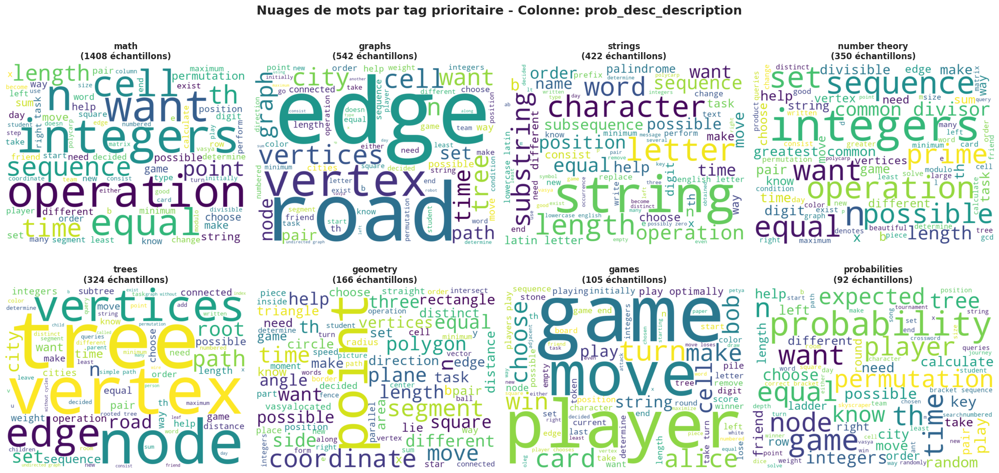

In [45]:
create_wordclouds_for_priority_tags(
    df=df,
    column='prob_desc_description',
    priority_tags=PRIORITY_TAGS,
    max_words=80,
    figsize=(20, 10),
    remove_latex=True
)


In [46]:
# Top mots par tag
top_words_desc = compare_top_words_by_tag(
    df=df,
    column='prob_desc_description',
    priority_tags=PRIORITY_TAGS,
    top_n=15,
    remove_latex=True
)


TOP MOTS PAR TAG PRIORITAIRE - Colonne: prob_desc_description

🏷️  MATH (1408 échantillons)
--------------------------------------------------------------------------------
   1. integers             →   783 occurrences
   2. possible             →   511 occurrences
   3. sequence             →   499 occurrences
   4. equal                →   472 occurrences
   5. length               →   458 occurrences
   6. -th                  →   454 occurrences
   7. permutation          →   404 occurrences
   8. wants                →   401 occurrences
   9. operation            →   379 occurrences
  10. cell                 →   378 occurrences
  11. help                 →   366 occurrences
  12. string               →   366 occurrences
  13. different            →   344 occurrences
  14. sum                  →   335 occurrences
  15. make                 →   334 occurrences

🏷️  GRAPHS (542 échantillons)
--------------------------------------------------------------------------------
   1. grap

### 4.2 Colonne : prob_desc_input_spec

Spécification du format d'entrée - souvent révélateur du type de problème.


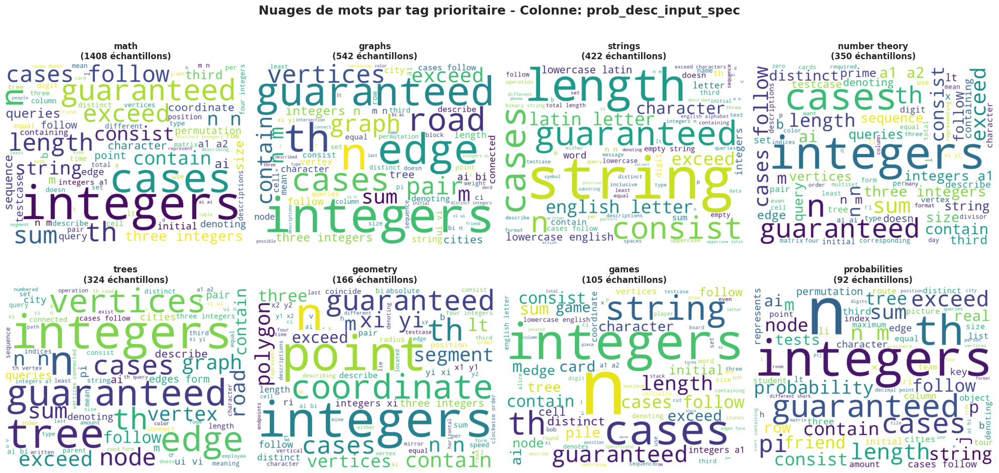

TOP MOTS PAR TAG PRIORITAIRE - Colonne: prob_desc_input_spec

🏷️  MATH (1408 échantillons)
--------------------------------------------------------------------------------
   1. integers             →  1587 occurrences
   2. cases                →  1260 occurrences
   3. guaranteed           →   452 occurrences
   4. sum                  →   317 occurrences
   5. exceed               →   304 occurrences
   6. -th                  →   292 occurrences
   7. length               →   271 occurrences
   8. follow               →   202 occurrences
   9. contain              →   199 occurrences
  10. three                →   190 occurrences
  11. 105                  →   173 occurrences
  12. consists             →   172 occurrences
  13. string               →   172 occurrences
  14. follows              →   150 occurrences
  15. 109                  →   148 occurrences

🏷️  GRAPHS (542 échantillons)
--------------------------------------------------------------------------------
   1. integ

In [47]:
create_wordclouds_for_priority_tags(
    df=df,
    column='prob_desc_input_spec',
    priority_tags=PRIORITY_TAGS,
    max_words=80,
    figsize=(20, 10),
    remove_latex=True
)

# Top mots
top_words_input = compare_top_words_by_tag(
    df=df,
    column='prob_desc_input_spec',
    priority_tags=PRIORITY_TAGS,
    top_n=15,
    remove_latex=True
)


### 4.3 Colonne : prob_desc_output_spec

Spécification du format de sortie.


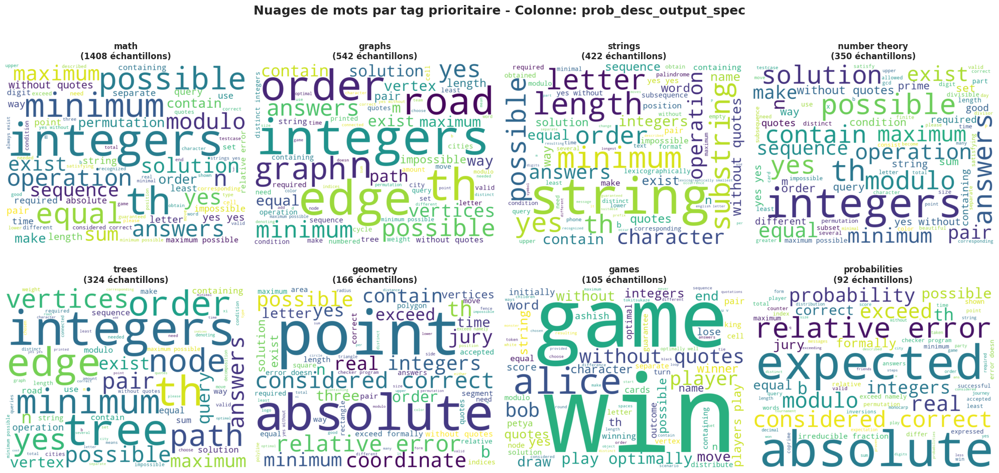

TOP MOTS PAR TAG PRIORITAIRE - Colonne: prob_desc_output_spec

🏷️  MATH (1408 échantillons)
--------------------------------------------------------------------------------
   1. integers             →   395 occurrences
   2. yes                  →   352 occurrences
   3. possible             →   276 occurrences
   4. minimum              →   236 occurrences
   5. -th                  →   182 occurrences
   6. maximum              →   164 occurrences
   7. answers              →   146 occurrences
   8. without              →   146 occurrences
   9. modulo               →   141 occurrences
  10. equal                →   135 occurrences
  11. quotes               →   127 occurrences
  12. exists               →   115 occurrences
  13. order                →   107 occurrences
  14. operations           →    98 occurrences
  15. sum                  →    93 occurrences

🏷️  GRAPHS (542 échantillons)
--------------------------------------------------------------------------------
   1. inte

In [48]:
create_wordclouds_for_priority_tags(
    df=df,
    column='prob_desc_output_spec',
    priority_tags=PRIORITY_TAGS,
    max_words=80,
    figsize=(20, 10),
    remove_latex=True
)

# Top mots
top_words_output = compare_top_words_by_tag(
    df=df,
    column='prob_desc_output_spec',
    priority_tags=PRIORITY_TAGS,
    top_n=15,
    remove_latex=True
)


### 4.4 Colonne : prob_desc_notes

Notes additionnelles explicatives (27% manquantes).


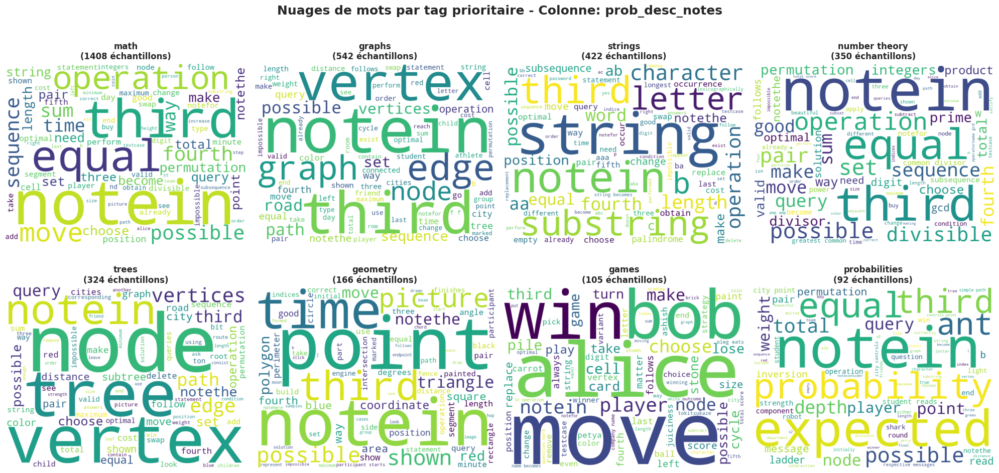

TOP MOTS PAR TAG PRIORITAIRE - Colonne: prob_desc_notes

🏷️  MATH (1408 échantillons)
--------------------------------------------------------------------------------
   1. notein               →   682 occurrences
   2. third                →   527 occurrences
   3. equal                →   294 occurrences
   4. possible             →   272 occurrences
   5. fourth               →   191 occurrences
   6. operation            →   181 occurrences
   7. sequence             →   161 occurrences
   8. sum                  →   154 occurrences
   9. query                →   141 occurrences
  10. total                →   135 occurrences
  11. move                 →   130 occurrences
  12. operations           →   129 occurrences
  13. make                 →   127 occurrences
  14. choose               →   125 occurrences
  15. permutation          →   117 occurrences

🏷️  GRAPHS (542 échantillons)
--------------------------------------------------------------------------------
   1. notein    

In [49]:
create_wordclouds_for_priority_tags(
    df=df,
    column='prob_desc_notes',
    priority_tags=PRIORITY_TAGS,
    max_words=80,
    figsize=(20, 10),
    remove_latex=True
)

# Top mots
top_words_notes = compare_top_words_by_tag(
    df=df,
    column='prob_desc_notes',
    priority_tags=PRIORITY_TAGS,
    top_n=15,
    remove_latex=True
)


## 5. Analyse des Char N-grams

Les char n-grams (3-5) capturent des patterns courts très discriminants comme `gcd`, `mod`, `dfs`, `binom`, `Pr(`, etc.

**Deux analyses complémentaires** :
1. **Globale** : Top n-grams les plus fréquents (tous tags confondus)
2. **Par tag** : N-grams discriminants (surreprésentés) via log-odds ratio

**Intérêt** : Les char n-grams sont robustes aux variations et capturent des signaux que les word n-grams manquent.


### 5.1 Char N-grams Globaux (sur prob_desc_description)


In [11]:
ngrams_global_desc = analyze_char_ngrams_global(
    df=df,
    column='prob_desc_description',
    n_range=(3, 5),
    top_n=30
)


CHAR N-GRAMS GLOBAUX - Colonne: prob_desc_description

📊 Top 30 char 3-grams:
  N-gram            Count   Examples
  ----------   ----------   ------------------------------
   th               87225
  $$$               79691
  the               75342
  he                66642
   $$               38196
   of               30439
  of                30013
   to               25358
   an               25030
  is                24313
  to                24073
  $$                23744
   in               23297
  nd                22405
  er                22253
  ing               20216
  and               19108
   is               18928
  re                18260
  ng                18137

📊 Top 30 char 4-grams:
  N-gram            Count   Examples
  ----------   ----------   ------------------------------
   the              68756
  the               59725
   $$$              38196
   of               29933
  $$$               23744
   to               22617
   is               18061
  an

### 5.2 Char N-grams Discriminants par Tag (prob_desc_description)

Identification des n-grams caractéristiques de chaque tag via enrichissement (log-odds ratio).


In [12]:
# 3-grams discriminants
print("=" * 100)
print("3-GRAMS DISCRIMINANTS PAR TAG")
print("=" * 100)
ngrams_by_tag_3 = analyze_char_ngrams_by_tag(
    df=df,
    column='prob_desc_description',
    priority_tags=PRIORITY_TAGS,
    n=3,
    top_n=20
)

# 4-grams discriminants
print("\n\n" + "=" * 100)
print("4-GRAMS DISCRIMINANTS PAR TAG")
print("=" * 100)
ngrams_by_tag_4 = analyze_char_ngrams_by_tag(
    df=df,
    column='prob_desc_description',
    priority_tags=PRIORITY_TAGS,
    n=4,
    top_n=20
)

# 5-grams discriminants
print("\n\n" + "=" * 100)
print("5-GRAMS DISCRIMINANTS PAR TAG")
print("=" * 100)
ngrams_by_tag_5 = analyze_char_ngrams_by_tag(
    df=df,
    column='prob_desc_description',
    priority_tags=PRIORITY_TAGS,
    n=5,
    top_n=20
)


3-GRAMS DISCRIMINANTS PAR TAG
CHAR 3-GRAMS DISCRIMINANTS PAR TAG - Colonne: prob_desc_description

🏷️  MATH
  N-gram            Count
  ----------   ----------
  $$a                1938
  $$.                2318
   $$               13611
  $$$               28379
  $$                 8304
  nte                2267
  num                2650
  int                2908
  umb                2615
   nu                2616
  mbe                2703
  ati                2166
   di                2108
  ber                2800
  ive                2009

🏷️  GRAPHS
  N-gram            Count
  ----------   ----------
  ert                 914
   ve                 967
  ect                1132
   ro                 925
  ted                1031
  ver                1517
   pa                1008
  con                1388
   fr                1067
  her                1622
  ach                 969
  ed                 2508
  eac                 899
   co                2417
  rom                 

## 6. Document Texte Unifié

Création d'un document unique par échantillon, concaténant toutes les colonnes textuelles avec des tokens spéciaux.

**Tokens utilisés** :
- `[DESC]` : Description du problème
- `[IN]` : Spécification d'entrée
- `[OUT]` : Spécification de sortie
- `[NOTES]` ou `[NOTES_MISSING]` : Notes additionnelles
- `[SAMPLE_IN]` : Exemples d'entrée
- `[SAMPLE_OUT]` : Exemples de sortie

**Intérêt** : Permet au modèle de capturer des signaux distribués sur plusieurs colonnes.


In [51]:
print("🔨 Création du document texte unifié (version traduite)...")

# Créer la colonne unified_document avec les textes traduits
df['unified_document'] = df.apply(lambda row: create_unified_document(row, suffix="_translated"), axis=1)

# Statistiques
df['unified_doc_length'] = df['unified_document'].str.len()

print(f"\n✅ Document unifié créé pour {len(df)} échantillons")
print(f"\n📊 Statistiques de longueur:")
print(df['unified_doc_length'].describe())

# Exemple
print(f"\n📄 Exemple de document unifié (échantillon 0):")
print("=" * 100)
print(df.iloc[0]['unified_document'][:800])
print("\n...")
print("=" * 100)

🔨 Création du document texte unifié (version traduite)...

✅ Document unifié créé pour 4982 échantillons

📊 Statistiques de longueur:
count    4982.000000
mean     2032.678041
std       739.273789
min       392.000000
25%      1509.000000
50%      1948.000000
75%      2435.750000
max      5628.000000
Name: unified_doc_length, dtype: float64

📄 Exemple de document unifié (échantillon 0):
[DESC] Numbers $$$1, 2, 3, \dots n$$$ (each integer from $$$1$$$ to $$$n$$$ once) are written on a board. In one operation you can erase any two numbers $$$a$$$ and $$$b$$$ from the board and write one integer $$$\frac{a + b}{2}$$$ rounded up instead.You should perform the given operation $$$n - 1$$$ times and make the resulting number that will be left on the board as small as possible. For example, if $$$n = 4$$$, the following course of action is optimal:  choose $$$a = 4$$$ and $$$b = 2$$$, so the new number is $$$3$$$, and the whiteboard contains $$$[1, 3, 3]$$$;  choose $$$a = 3$$$ and $$$b = 3$$$

### 6.1 Nuages de Mots sur le Document Unifié


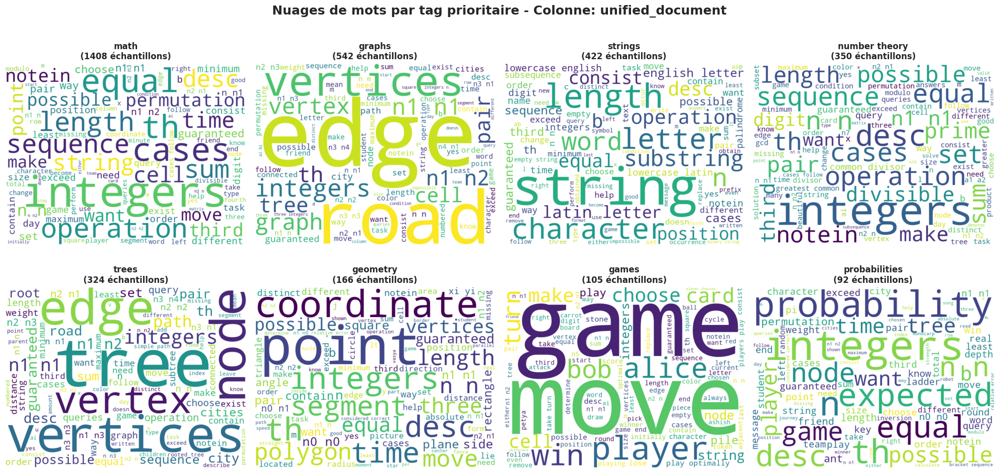

TOP MOTS PAR TAG PRIORITAIRE - Colonne: unified_document

🏷️  MATH (1408 échantillons)
--------------------------------------------------------------------------------
   1. integers             →  2826 occurrences
   2. desc                 →  1408 occurrences
   3. cases                →  1373 occurrences
   4. possible             →  1084 occurrences
   5. -th                  →   972 occurrences
   6. equal                →   944 occurrences
   7. length               →   914 occurrences
   8. sum                  →   899 occurrences
   9. sequence             →   848 occurrences
  10. third                →   721 occurrences
  11. string               →   693 occurrences
  12. notein               →   681 occurrences
  13. permutation          →   672 occurrences
  14. operation            →   627 occurrences
  15. minimum              →   601 occurrences
  16. yes                  →   561 occurrences
  17. guaranteed           →   554 occurrences
  18. make                 →   55

In [52]:
create_wordclouds_for_priority_tags(
    df=df,
    column='unified_document',
    priority_tags=PRIORITY_TAGS,
    max_words=100,
    figsize=(20, 10),
    remove_latex=True
)

# Top mots du document unifié
top_words_unified = compare_top_words_by_tag(
    df=df,
    column='unified_document',
    priority_tags=PRIORITY_TAGS,
    top_n=20,
    remove_latex=True
)


## 7. Analyses LaTeX Avancées

Extraction et analyse des features LaTeX sur toutes les colonnes.

**Features extraites** :
- Nombre de blocs LaTeX (`$$$...$$$`)
- Nombre de symboles LaTeX (`\gcd`, `\frac`, etc.)
- Densité LaTeX (ratio longueur LaTeX / longueur totale)
- Densité des symboles
- Compte détaillé par symbole


In [53]:
print("🔨 Extraction des features LaTeX sur prob_desc_description...")

# Appliquer le preprocessing complet
latex_analysis = df['prob_desc_description'].apply(preprocess_text_full)

# Séparer clean_text et latex_features
df['clean_description'] = latex_analysis.apply(lambda x: x[0])
df['latex_features_desc'] = latex_analysis.apply(lambda x: x[1])

# Extraire les métriques principales
df['nb_latex_blocks_desc'] = df['latex_features_desc'].apply(lambda x: x['nb_latex_blocks'])
df['nb_latex_symbols_desc'] = df['latex_features_desc'].apply(lambda x: x['nb_latex_symbols'])
df['latex_density_desc'] = df['latex_features_desc'].apply(lambda x: x['latex_density'])
df['latex_symbols_density_desc'] = df['latex_features_desc'].apply(lambda x: x['latex_symbols_density'])

print(f"\n✅ Features LaTeX extraites")
print(f"\n📊 Statistiques LaTeX sur prob_desc_description:")
print(f"  Échantillons avec LaTeX: {(df['nb_latex_blocks_desc'] > 0).sum()} / {len(df)} ({(df['nb_latex_blocks_desc'] > 0).sum()/len(df)*100:.1f}%)")
print(f"  Moyenne blocs LaTeX: {df['nb_latex_blocks_desc'].mean():.2f}")
print(f"  Moyenne symboles LaTeX: {df['nb_latex_symbols_desc'].mean():.2f}")
print(f"  Densité LaTeX moyenne: {df['latex_density_desc'].mean():.4f}")


🔨 Extraction des features LaTeX sur prob_desc_description...

✅ Features LaTeX extraites

📊 Statistiques LaTeX sur prob_desc_description:
  Échantillons avec LaTeX: 2784 / 4982 (55.9%)
  Moyenne blocs LaTeX: 7.94
  Moyenne symboles LaTeX: 1.62
  Densité LaTeX moyenne: 0.0991



📊 Densité LaTeX par tag prioritaire:
  Tag                      Densité Blocs     Densité Symboles
  --------------------   ---------------   ------------------
  math                            0.1394               0.0029
  graphs                          0.0835               0.0012
  strings                         0.0861               0.0013
  number theory                   0.1568               0.0036
  trees                           0.0893               0.0014
  geometry                        0.0715               0.0012
  games                           0.0645               0.0012
  probabilities                   0.0892               0.0018


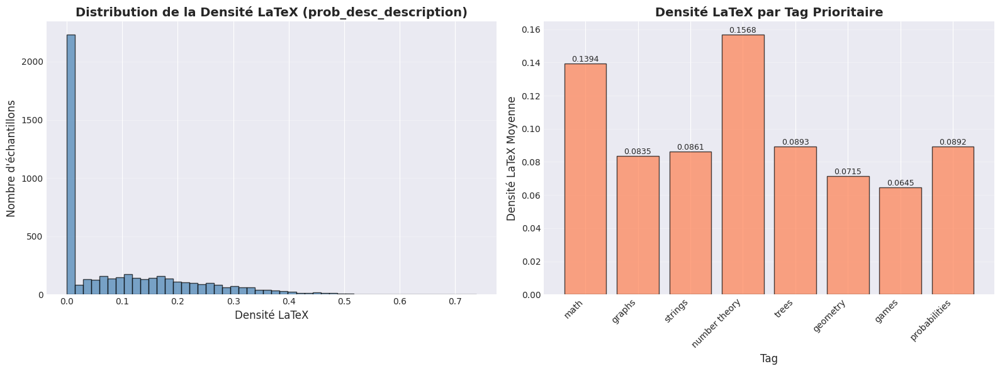


💡 Insight: 'number theory' et 'math' ont la densité LaTeX la plus élevée (formules mathématiques complexes)


In [65]:
# Densité LaTeX par tag prioritaire
print("\n📊 Densité LaTeX par tag prioritaire:")
print(f"  {'Tag':20s}   {'Densité Blocs':>15s}   {'Densité Symboles':>18s}")
print(f"  {'-'*20}   {'-'*15}   {'-'*18}")

tag_latex_stats = []
for tag in PRIORITY_TAGS:
    mask = df['tags'].apply(lambda tags: tag in tags if isinstance(tags, list) else False)
    if mask.sum() > 0:
        avg_density = df[mask]['latex_density_desc'].mean()
        avg_density_symbols = df[mask]['latex_symbols_density_desc'].mean()
        print(f"  {tag:20s}   {avg_density:15.4f}   {avg_density_symbols:18.4f}")
        tag_latex_stats.append((tag, avg_density, avg_density_symbols))

# Visualisation
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Distribution globale
ax1.hist(df['latex_density_desc'], bins=50, color='steelblue', alpha=0.7, edgecolor='black')
ax1.set_xlabel('Densité LaTeX', fontsize=12)
ax1.set_ylabel('Nombre d\'échantillons', fontsize=12)
ax1.set_title('Distribution de la Densité LaTeX (prob_desc_description)', fontsize=14, fontweight='bold')
ax1.grid(axis='y', alpha=0.3)

# Densité par tag (barplot)
tags_list, densities, _ = zip(*tag_latex_stats)
bars = ax2.bar(range(len(tags_list)), densities, color='coral', alpha=0.7, edgecolor='black')
ax2.set_xticks(range(len(tags_list)))
ax2.set_xticklabels(tags_list, rotation=45, ha='right')
ax2.set_xlabel('Tag', fontsize=12)
ax2.set_ylabel('Densité LaTeX Moyenne', fontsize=12)
ax2.set_title('Densité LaTeX par Tag Prioritaire', fontsize=14, fontweight='bold')
ax2.grid(axis='y', alpha=0.3)

# Ajouter valeurs
for bar, val in zip(bars, densities):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height,
            f'{val:.4f}',
            ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

print("\n💡 Insight: 'number theory' et 'math' ont la densité LaTeX la plus élevée (formules mathématiques complexes)")


### 7.1 Enrichissement des Symboles LaTeX par Tag

**Objectif** : Identifier quels symboles LaTeX sont **surreprésentés** dans chaque tag (via le Lift).

**Méthode** :
- **Lift** = P(symbole|tag) / P(symbole)
- Lift > 1 : symbole surreprésenté dans ce tag
- Lift < 1 : symbole sous-représenté dans ce tag

**Utilité** : 
- Comprendre les caractéristiques mathématiques de chaque tag
- Créer des features discriminantes (ex: présence de `\gcd` pour `number theory`)
- Valider les hypothèses sur les tags (ex: `\sum`, `\prod` pour `math`)


In [68]:
print("=" * 100)
print("EXTRACTION DE TOUS LES SYMBOLES LaTeX")
print("=" * 100)

# Extraire tous les symboles LaTeX de prob_desc_description
latex_stats_df = extract_all_latex_symbols(df, column='prob_desc_description')

print(f"\n✅ Extraction terminée")
print(f"📊 Shape du DataFrame: {latex_stats_df.shape}")
print(f"   - {latex_stats_df.shape[0]} échantillons")
print(f"   - {latex_stats_df.shape[1]} symboles LaTeX uniques")

# Statistiques sur les symboles les plus fréquents
symbol_counts = latex_stats_df.sum().sort_values(ascending=False)
print(f"\n🔝 Top 20 symboles LaTeX les plus fréquents:")
for i, (symbol, count) in enumerate(symbol_counts.head(20).items(), 1):
    print(f"  {i:2d}. {symbol:20s} → {count:4d} occurrences ({count/len(df)*100:5.1f}%)")


EXTRACTION DE TOUS LES SYMBOLES LaTeX
📝 117 symboles LaTeX uniques trouvés

✅ Extraction terminée
📊 Shape du DataFrame: (4973, 117)
   - 4973 échantillons
   - 117 symboles LaTeX uniques

🔝 Top 20 symboles LaTeX les plus fréquents:
   1. \le                  →  909 occurrences ( 18.3%)
   2. \ldots               →  453 occurrences (  9.1%)
   3. \dots                →  418 occurrences (  8.4%)
   4. \leq                 →  281 occurrences (  5.7%)
   5. \cdot                →  252 occurrences (  5.1%)
   6. \frac                →  177 occurrences (  3.6%)
   7. \times               →  177 occurrences (  3.6%)
   8. \ne                  →  176 occurrences (  3.5%)
   9. \ge                  →  138 occurrences (  2.8%)
  10. \sum                 →  109 occurrences (  2.2%)
  11. \limits              →   90 occurrences (  1.8%)
  12. \neq                 →   89 occurrences (  1.8%)
  13. \max                 →   67 occurrences (  1.3%)
  14. \right               →   65 occurrences (  1.3%

In [69]:
print("\n" + "=" * 100)
print("CALCUL DE L'ENRICHISSEMENT (LIFT) DES SYMBOLES PAR TAG")
print("=" * 100)

# Calculer le lift pour chaque symbole et chaque tag
lift_df = analyze_latex_enrichment_by_tag(
    df, 
    latex_stats_df, 
    tags_column='tags', 
    min_docs=5  # Symboles présents dans au moins 5 documents
)

print(f"\n✅ Analyse de l'enrichissement terminée")
print(f"📊 Matrice de lift: {lift_df.shape}")
print(f"   - {lift_df.shape[0]} symboles LaTeX")
print(f"   - {lift_df.shape[1]} tags")
print(f"\n💡 Lift > 1 = symbole surreprésenté dans ce tag")
print(f"💡 Lift < 1 = symbole sous-représenté dans ce tag")



CALCUL DE L'ENRICHISSEMENT (LIFT) DES SYMBOLES PAR TAG
🔍 Analyse de l'enrichissement sur 54 symboles (présents dans ≥5 docs)
🏷️  37 tags à analyser

✅ Analyse de l'enrichissement terminée
📊 Matrice de lift: (54, 37)
   - 54 symboles LaTeX
   - 37 tags

💡 Lift > 1 = symbole surreprésenté dans ce tag
💡 Lift < 1 = symbole sous-représenté dans ce tag


In [70]:
# Afficher les symboles caractéristiques des tags prioritaires
print_tag_specific_symbols(
    lift_df, 
    PRIORITY_TAGS, 
    top_n=10,  # Top 10 symboles par tag
    lift_threshold=1.3  # Seuil pour considérer un symbole comme "surreprésenté"
)


🔍 SYMBOLES LaTeX CARACTÉRISTIQUES PAR TAG

🏷️  TAG: MATH
----------------------------------------------------------------------------------------------------
  ✨ Symboles SURREPRÉSENTÉS (lift ≥ 1.3):
     1. \gcd                 → 3.17x plus fréquent
     2. \sqrt                → 3.03x plus fréquent
     3. \subset              → 2.83x plus fréquent
     4. \not                 → 2.53x plus fréquent
     5. \lvert               → 2.53x plus fréquent
     6. \rvert               → 2.53x plus fréquent
     7. \pmod                → 2.45x plus fréquent
     8. \bmod                → 2.34x plus fréquent
     9. \mathrm              → 2.12x plus fréquent
    10. \equiv               → 2.12x plus fréquent

🏷️  TAG: GRAPHS
----------------------------------------------------------------------------------------------------
  ✨ Symboles SURREPRÉSENTÉS (lift ≥ 1.3):
     1. \to                  → 2.47x plus fréquent
     2. \rightarrow          → 2.21x plus fréquent
     3. \log                


VISUALISATION: HEATMAP DE L'ENRICHISSEMENT DES SYMBOLES LaTeX PAR TAG


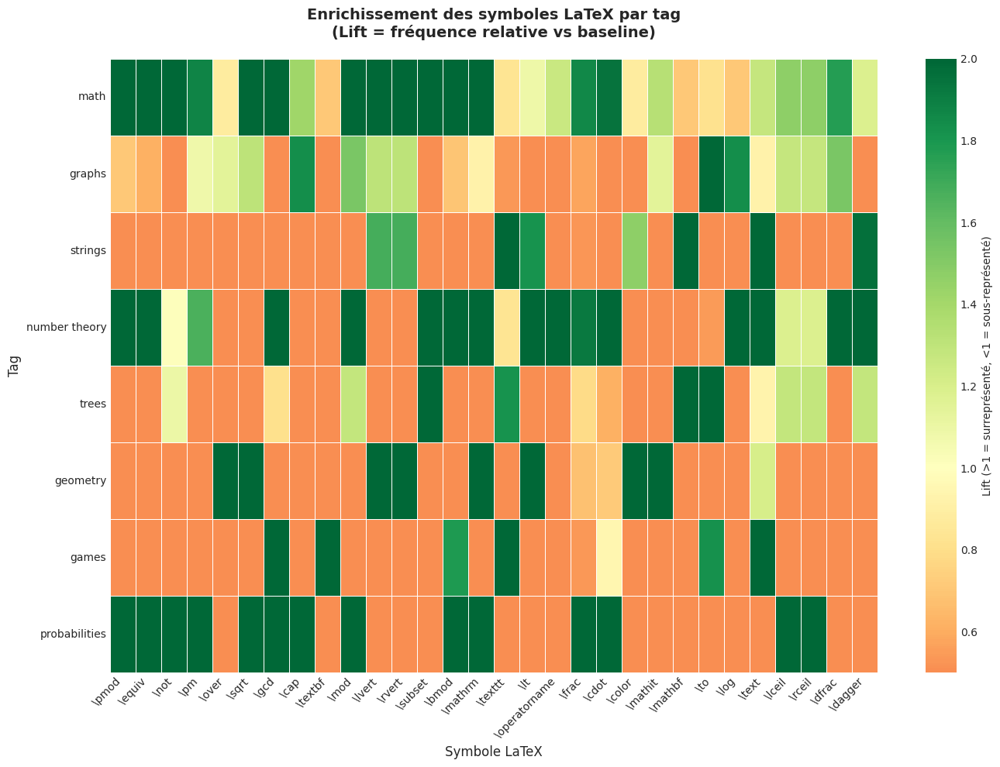


💡 Insight: Les couleurs vertes indiquent une surreprésentation (lift > 1)
           Les couleurs rouges indiquent une sous-représentation (lift < 1)


In [71]:
# Visualisation: Heatmap de l'enrichissement
print("\n" + "=" * 100)
print("VISUALISATION: HEATMAP DE L'ENRICHISSEMENT DES SYMBOLES LaTeX PAR TAG")
print("=" * 100)

plot_latex_enrichment_heatmap(
    lift_df, 
    priority_tags=PRIORITY_TAGS, 
    top_symbols=30,  # Afficher les 30 symboles les plus variables
    figsize=(14, 10)
)

print("\n💡 Insight: Les couleurs vertes indiquent une surreprésentation (lift > 1)")
print("           Les couleurs rouges indiquent une sous-représentation (lift < 1)")



COMPARAISON DE SYMBOLES LaTeX ENTRE DEUX TAGS

🔍 Comparaison: MATH vs GRAPHS


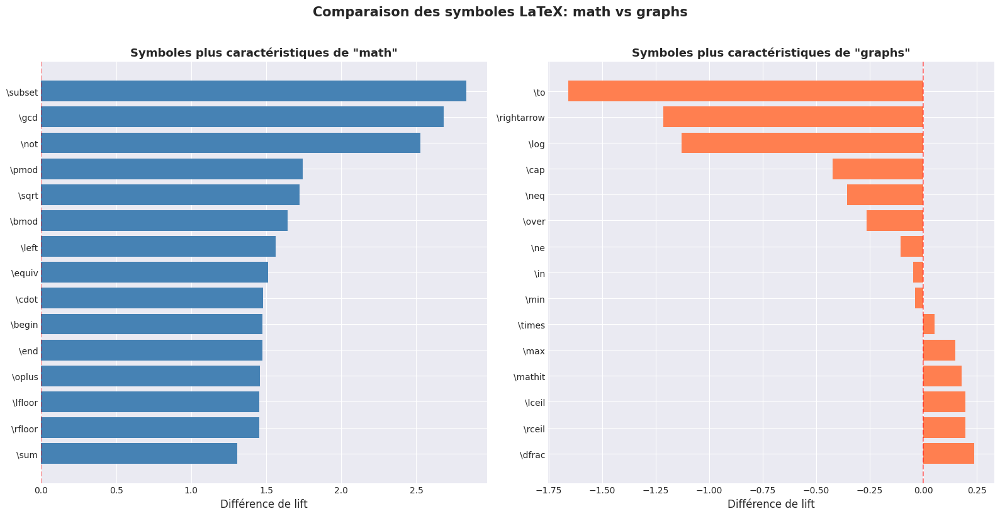


🔍 Comparaison: GEOMETRY vs NUMBER THEORY


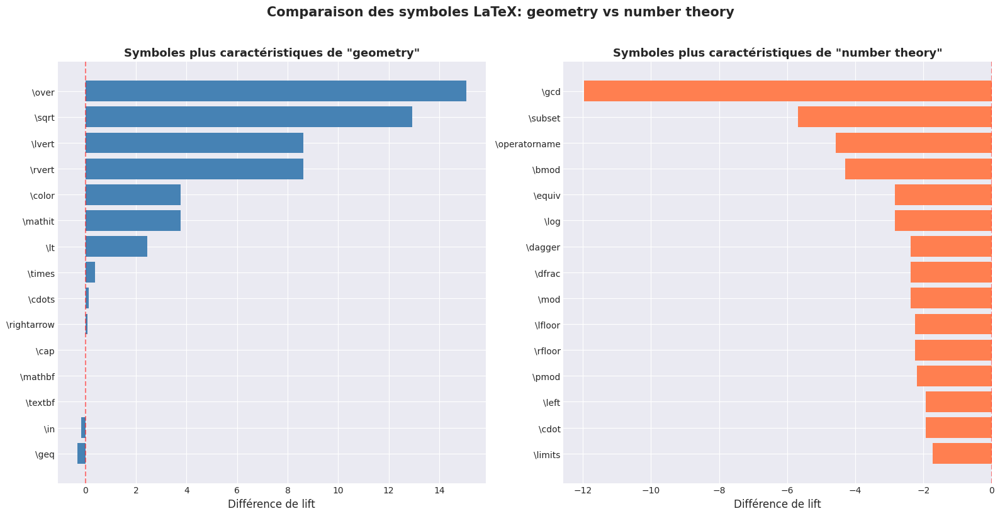


💡 Insight: Ces comparaisons permettent de voir rapidement les différences
           de notation mathématique entre les tags


In [72]:
# Comparaison de deux tags spécifiques
print("\n" + "=" * 100)
print("COMPARAISON DE SYMBOLES LaTeX ENTRE DEUX TAGS")
print("=" * 100)

# Exemple 1: math vs graphs
print("\n🔍 Comparaison: MATH vs GRAPHS")
compare_tags_latex_symbols(lift_df, 'math', 'graphs', top_n=15)

# Exemple 2: geometry vs number theory
print("\n🔍 Comparaison: GEOMETRY vs NUMBER THEORY")
compare_tags_latex_symbols(lift_df, 'geometry', 'number theory', top_n=15)

print("\n💡 Insight: Ces comparaisons permettent de voir rapidement les différences")
print("           de notation mathématique entre les tags")


### 7.2 Synthèse de l'Analyse LaTeX\n\n**Découvertes principales** :\n\n1. **Symboles caractéristiques par tag** :\n   - `math` : symboles arithmétiques (`\\gcd`, `\\sqrt`, `\\sum`, `\\prod`, `\\mod`)\n   - `graphs` : symboles de connectivité (`\\to`, `\\rightarrow`, `\\cap`)\n   - `number theory` : symboles de congruence (`\\equiv`, `\\pmod`, `\\bmod`)\n   - `geometry` : symboles géométriques (`\\angle`, `\\pi`, `\\triangle`)\n   - `probabilities` : symboles probabilistes (`\\binom`, `\\frac`)\n\n2. **Utilité pour la modélisation** :\n   - Créer des **features binaires** : `has_gcd`, `has_sum`, `has_to`, etc.\n   - Créer des **features de comptage** : `count_gcd`, `count_sum`, etc.\n   - Calculer le **lift moyen** des symboles présents dans un échantillon pour chaque tag\n\n3. **Validation des hypothèses** :\n   - Les tags ont effectivement des **signatures LaTeX distinctes**\n   - La densité LaTeX seule ne suffit pas : il faut regarder **quels symboles** sont présents\n\n**Prochaines étapes** :\n- Extraire ces features LaTeX pour le preprocessing\n- Tester leur importance dans les modèles de classification

## 7.3 Analyse des Variables Numériques

Analyse approfondie des variables numériques du dataset :
- `difficulty` : niveau de difficulté du problème
- `prob_desc_time_limit` : limite de temps (conversion en secondes)
- Longueur des textes : `prob_desc_description`

**Objectifs** :
- Comprendre la distribution de ces variables
- Identifier si elles sont discriminantes pour les tags
- Créer des features numériques pour la modélisation


### 7.3.1 Analyse de `difficulty`

**Question** : La difficulté est-elle discriminante pour les tags ?


ANALYSE DE LA VARIABLE 'difficulty'

📊 Statistiques globales sur 'difficulty':
  Count    : 4935
  Missing  : 38
  Mean     : 1667.27
  Median   : 1700.00
  Std      : 567.71
  Min      : -1
  Max      : 3500
  Q1 (25%) : 1200.00
  Q3 (75%) : 2100.00

📈 Distribution des valeurs de 'difficulty':
  difficulty = -1 →   15 occurrences (  0.3%)
  difficulty = 800 →  449 occurrences (  9.0%)
  difficulty = 900 →  167 occurrences (  3.4%)
  difficulty = 1000 →  193 occurrences (  3.9%)
  difficulty = 1100 →  214 occurrences (  4.3%)
  difficulty = 1200 →  267 occurrences (  5.4%)
  difficulty = 1300 →  261 occurrences (  5.2%)
  difficulty = 1400 →  255 occurrences (  5.1%)
  difficulty = 1500 →  312 occurrences (  6.3%)
  difficulty = 1600 →  316 occurrences (  6.4%)
  difficulty = 1700 →  307 occurrences (  6.2%)
  difficulty = 1800 →  293 occurrences (  5.9%)
  difficulty = 1900 →  313 occurrences (  6.3%)
  difficulty = 2000 →  284 occurrences (  5.7%)
  difficulty = 2100 →  240 occurrenc

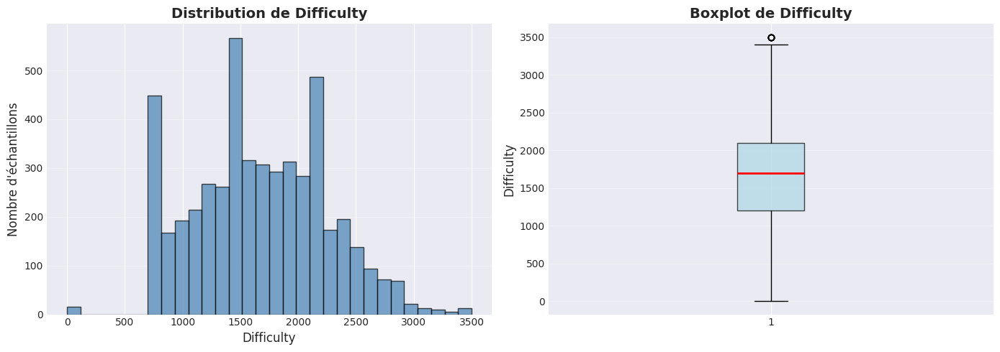

In [84]:
print("=" * 100)
print("ANALYSE DE LA VARIABLE 'difficulty'")
print("=" * 100)

# Statistiques globales
print(f"\n📊 Statistiques globales sur 'difficulty':")
print(f"  Count    : {df['difficulty'].count()}")
print(f"  Missing  : {df['difficulty'].isna().sum()}")
print(f"  Mean     : {df['difficulty'].mean():.2f}")
print(f"  Median   : {df['difficulty'].median():.2f}")
print(f"  Std      : {df['difficulty'].std():.2f}")
print(f"  Min      : {df['difficulty'].min():.0f}")
print(f"  Max      : {df['difficulty'].max():.0f}")
print(f"  Q1 (25%) : {df['difficulty'].quantile(0.25):.2f}")
print(f"  Q3 (75%) : {df['difficulty'].quantile(0.75):.2f}")

# Distribution des valeurs
print(f"\n📈 Distribution des valeurs de 'difficulty':")
difficulty_counts = df['difficulty'].value_counts().sort_index()
for value, count in difficulty_counts.items():
    print(f"  difficulty = {value:.0f} → {count:4d} occurrences ({count/len(df)*100:5.1f}%)")

# Visualisation
plot_numeric_distribution(df, 'difficulty', 'Difficulty', 'Difficulty', figsize=(14, 5))



STATISTIQUES DE DIFFICULTY PAR TAG PRIORITAIRE
  Tag                     Count         Mean       Median          Std          Min          Max
  --------------------   ------   ----------   ----------   ----------   ----------   ----------
  math                     1390      1630.21      1600.00       602.71        -1.00      3500.00
  graphs                    540      2005.74      2000.00       450.02        -1.00      3500.00
  strings                   420      1560.00      1500.00       527.38        -1.00      3200.00
  number theory             345      1786.09      1800.00       560.45       800.00      3500.00
  trees                     321      2051.71      2000.00       390.12       900.00      3100.00
  geometry                  163      1924.54      2000.00       591.83       800.00      3500.00
  games                     102      1789.22      1850.00       606.71       800.00      3500.00
  probabilities              91      2236.26      2200.00       400.98      130

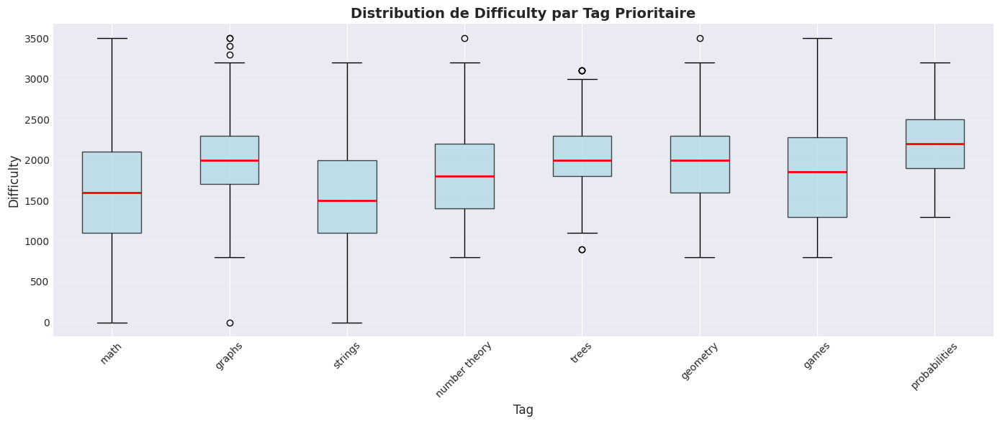


💡 Insight: Cette analyse permet de voir si certains tags sont associés
           à des problèmes plus difficiles ou plus faciles


In [85]:
# Analyse par tag prioritaire
print_numeric_stats_by_tag(df, 'difficulty', PRIORITY_TAGS, 'Difficulty')

# Visualisation par tag
plot_numeric_by_tag(
    df, 
    'difficulty', 
    PRIORITY_TAGS,
    'Distribution de Difficulty par Tag Prioritaire',
    'Difficulty'
)

print("\n💡 Insight: Cette analyse permet de voir si certains tags sont associés")
print("           à des problèmes plus difficiles ou plus faciles")


### 7.3.2 Analyse de `prob_desc_time_limit`

**Objectif** : Convertir la limite de temps en secondes (float) et analyser sa distribution.

**Formats à gérer** :
- Anglais : '2 seconds', '1 second', '0.5 seconds', '2.0 s'
- Russe : '1 секунда', '2 секунды'


🔄 Conversion de 'prob_desc_time_limit' en secondes...

✅ Conversion terminée:
   Converti : 4973 / 4973 (100.0%)
   Manquant :    0 / 4973 (0.0%)

📊 Valeurs uniques de time_limit_seconds:
      0.5s →   25 occurrences
      1.0s → 1916 occurrences
      1.5s →   52 occurrences
      2.0s → 2343 occurrences
      2.5s →   25 occurrences
      3.0s →  364 occurrences
      3.5s →    8 occurrences
      4.0s →  144 occurrences
      4.5s →    5 occurrences
      5.0s →   52 occurrences
      6.0s →   20 occurrences
      6.5s →    1 occurrences
      7.0s →    5 occurrences
      8.0s →    4 occurrences
      9.0s →    1 occurrences
     10.0s →    6 occurrences
     15.0s →    2 occurrences

STATISTIQUES GLOBALES SUR 'time_limit_seconds'
  Count    : 4973
  Missing  : 0
  Mean     : 1.82s
  Median   : 2.00s
  Std      : 0.97s
  Min      : 0.50s
  Max      : 15.00s
  Q1 (25%) : 1.00s
  Q3 (75%) : 2.00s



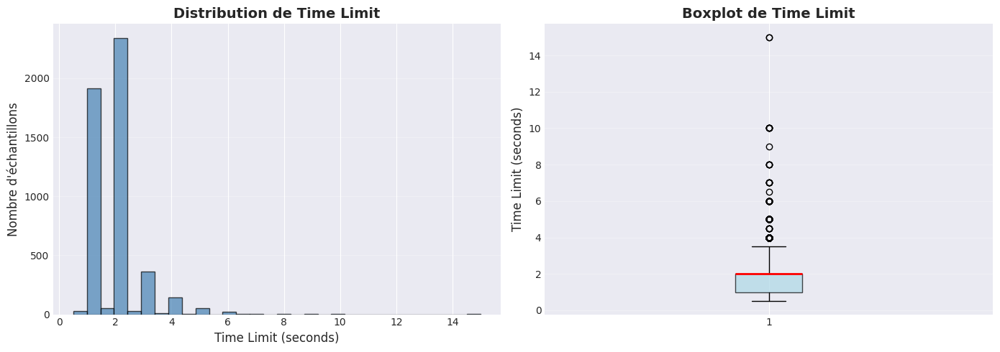

In [86]:
# Conversion de prob_desc_time_limit en secondes
df = convert_time_limit_column(df, column='prob_desc_time_limit')

# Statistiques globales
print(f"\n{'='*100}")
print("STATISTIQUES GLOBALES SUR 'time_limit_seconds'")
print(f"{'='*100}")
print(f"  Count    : {df['time_limit_seconds'].count()}")
print(f"  Missing  : {df['time_limit_seconds'].isna().sum()}")
print(f"  Mean     : {df['time_limit_seconds'].mean():.2f}s")
print(f"  Median   : {df['time_limit_seconds'].median():.2f}s")
print(f"  Std      : {df['time_limit_seconds'].std():.2f}s")
print(f"  Min      : {df['time_limit_seconds'].min():.2f}s")
print(f"  Max      : {df['time_limit_seconds'].max():.2f}s")
print(f"  Q1 (25%) : {df['time_limit_seconds'].quantile(0.25):.2f}s")
print(f"  Q3 (75%) : {df['time_limit_seconds'].quantile(0.75):.2f}s")
print(f"{'='*100}\n")

# Visualisation
plot_numeric_distribution(
    df, 
    'time_limit_seconds', 
    'Time Limit', 
    'Time Limit (seconds)',
    figsize=(14, 5)
)



STATISTIQUES DE TIME LIMIT (SECONDS) PAR TAG PRIORITAIRE
  Tag                     Count         Mean       Median          Std          Min          Max
  --------------------   ------   ----------   ----------   ----------   ----------   ----------
  math                     1405         1.75         2.00         0.97         0.50        10.00
  graphs                    541         2.15         2.00         1.25         1.00        15.00
  strings                   422         1.70         2.00         0.74         0.50         8.00
  number theory             350         1.99         2.00         1.18         0.50        10.00
  trees                     322         2.20         2.00         1.18         1.00        10.00
  geometry                  165         1.84         2.00         0.94         0.50         8.00
  games                     105         1.75         2.00         0.79         1.00         5.00
  probabilities              92         2.27         2.00         1.1

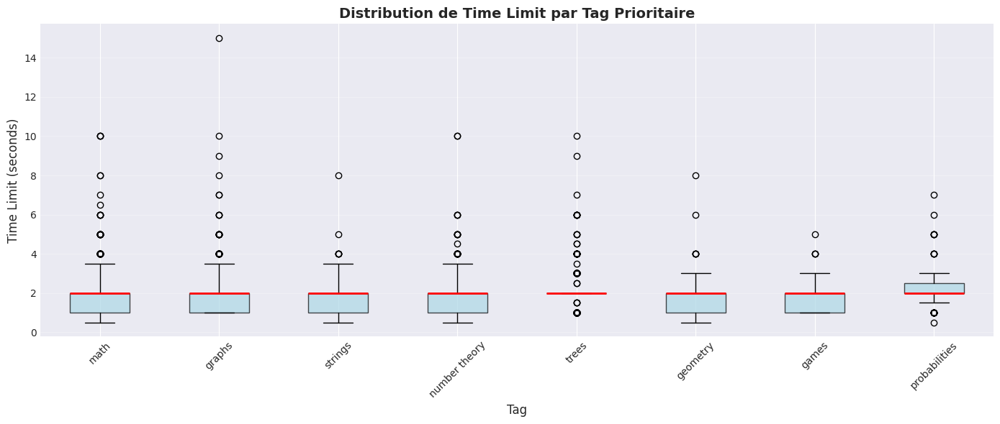


💡 Insight: Cette analyse permet de voir si certains tags ont des contraintes
           de temps différentes (plus ou moins de temps alloué)


In [87]:
# Analyse par tag prioritaire
print_numeric_stats_by_tag(df, 'time_limit_seconds', PRIORITY_TAGS, 'Time Limit (seconds)')

# Visualisation par tag
plot_numeric_by_tag(
    df, 
    'time_limit_seconds', 
    PRIORITY_TAGS,
    'Distribution de Time Limit par Tag Prioritaire',
    'Time Limit (seconds)'
)

print("\n💡 Insight: Cette analyse permet de voir si certains tags ont des contraintes")
print("           de temps différentes (plus ou moins de temps alloué)")


### 7.3.3 Corrélation entre `difficulty` et `time_limit_seconds`

**Question** : Les problèmes plus difficiles ont-ils plus de temps alloué ?


CORRÉLATION ENTRE 'difficulty' ET 'time_limit_seconds'
  Corrélation de Pearson : 0.3177



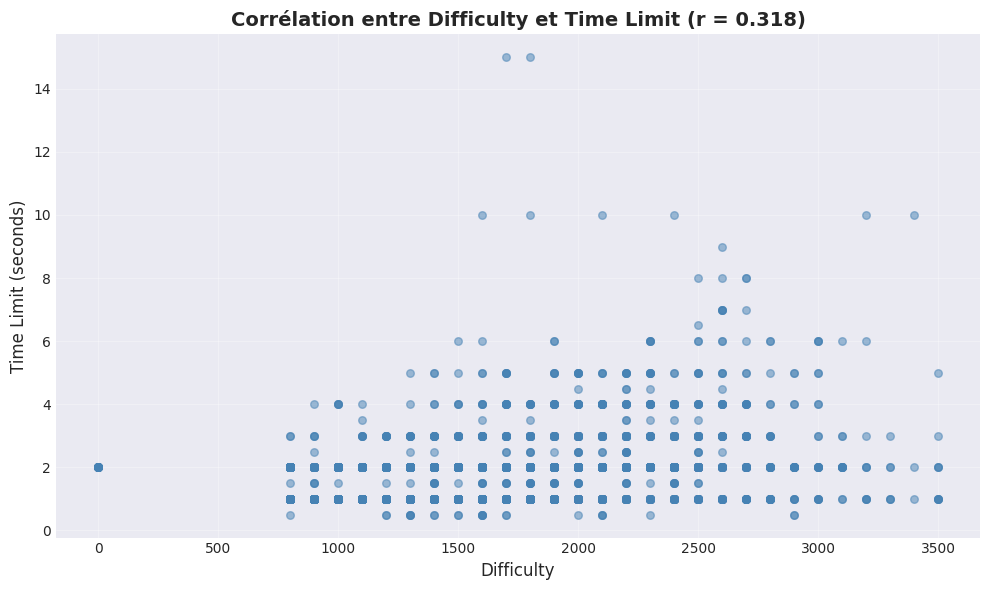

💡 Insight: Corrélation modérée - les deux variables sont liées


In [88]:
# Calculer la corrélation
corr = df[['difficulty', 'time_limit_seconds']].corr().iloc[0, 1]

print(f"{'='*100}")
print("CORRÉLATION ENTRE 'difficulty' ET 'time_limit_seconds'")
print(f"{'='*100}")
print(f"  Corrélation de Pearson : {corr:.4f}")
print(f"{'='*100}\n")

# Visualisation scatter plot
fig, ax = plt.subplots(figsize=(10, 6))

# Scatter plot
ax.scatter(df['difficulty'], df['time_limit_seconds'], alpha=0.5, s=30, color='steelblue')
ax.set_xlabel('Difficulty', fontsize=12)
ax.set_ylabel('Time Limit (seconds)', fontsize=12)
ax.set_title(f'Corrélation entre Difficulty et Time Limit (r = {corr:.3f})', 
             fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

if abs(corr) < 0.1:
    print("💡 Insight: Corrélation très faible - difficulty et time_limit sont quasi-indépendants")
elif abs(corr) < 0.3:
    print("💡 Insight: Corrélation faible - il y a un léger lien mais pas déterminant")
elif abs(corr) < 0.7:
    print("💡 Insight: Corrélation modérée - les deux variables sont liées")
else:
    print("💡 Insight: Corrélation forte - les deux variables sont fortement liées")


### 7.3.4 Analyse de la Longueur des Textes (`prob_desc_description`)

**Features analysées** :
- **char_length** : Nombre de caractères
- **word_count** : Nombre de mots
- **latex_ratio** : Ratio de LaTeX (déjà calculé précédemment)
- **latex_symbols_ratio** : Ratio de symboles LaTeX (déjà calculé précédemment)


📏 Calcul des statistiques de longueur sur 'prob_desc_description'...

✅ Statistiques calculées:
   - prob_desc_description_char_length
   - prob_desc_description_word_count
   - prob_desc_description_latex_ratio
   - prob_desc_description_latex_symbols_ratio

STATISTIQUES GLOBALES SUR LA LONGUEUR DES TEXTES

📊 prob_desc_description_char_length:
  Mean     : 951.15
  Median   : 874.00
  Std      : 453.27
  Min      : 63.00
  Max      : 3796.00
  Q1 (25%) : 626.00
  Q3 (75%) : 1198.00

📊 prob_desc_description_word_count:
  Mean     : 167.38
  Median   : 155.00
  Std      : 79.64
  Min      : 10.00
  Max      : 684.00
  Q1 (25%) : 110.00
  Q3 (75%) : 211.00

📊 prob_desc_description_latex_ratio:
  Mean     : 0.10
  Median   : 0.05
  Std      : 0.12
  Min      : 0.00
  Max      : 0.74
  Q1 (25%) : 0.00
  Q3 (75%) : 0.17

📊 prob_desc_description_latex_symbols_ratio:
  Mean     : 0.00
  Median   : 0.00
  Std      : 0.00
  Min      : 0.00
  Max      : 0.03
  Q1 (25%) : 0.00
  Q3 (75%) : 0.00



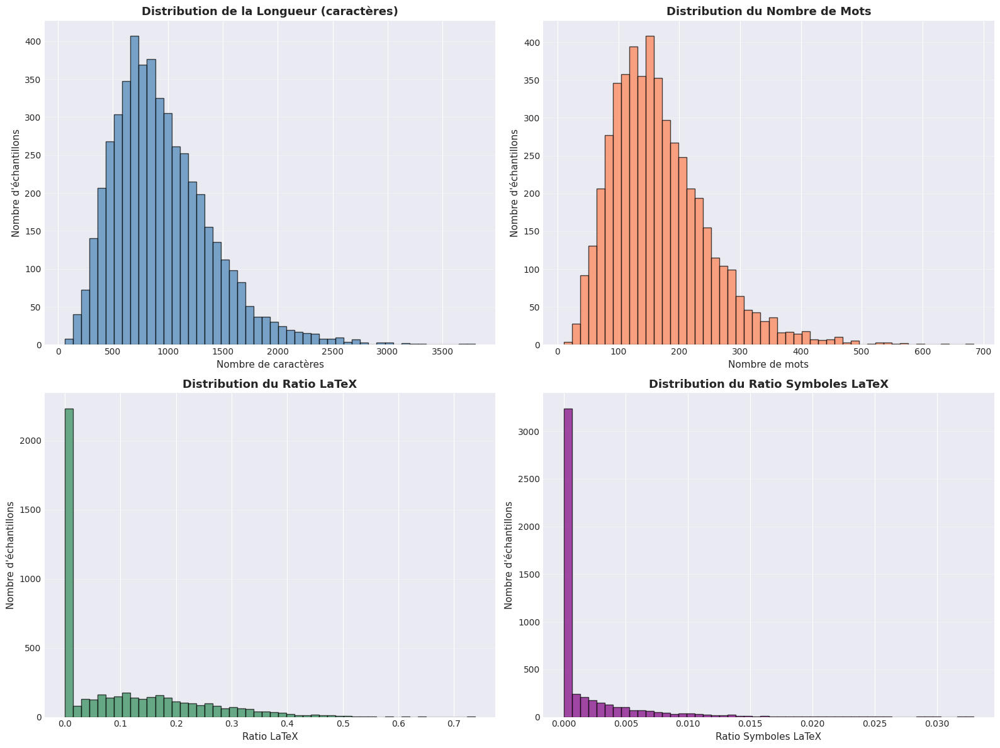

In [89]:
# Calculer les statistiques de longueur
df = compute_text_length_stats(df, column='prob_desc_description')

# Statistiques globales sur char_length
print(f"\n{'='*100}")
print("STATISTIQUES GLOBALES SUR LA LONGUEUR DES TEXTES")
print(f"{'='*100}")

for feature in ['prob_desc_description_char_length', 'prob_desc_description_word_count',
                'prob_desc_description_latex_ratio', 'prob_desc_description_latex_symbols_ratio']:
    if feature in df.columns:
        print(f"\n📊 {feature}:")
        print(f"  Mean     : {df[feature].mean():.2f}")
        print(f"  Median   : {df[feature].median():.2f}")
        print(f"  Std      : {df[feature].std():.2f}")
        print(f"  Min      : {df[feature].min():.2f}")
        print(f"  Max      : {df[feature].max():.2f}")
        print(f"  Q1 (25%) : {df[feature].quantile(0.25):.2f}")
        print(f"  Q3 (75%) : {df[feature].quantile(0.75):.2f}")

print(f"{'='*100}\n")

# Visualisation des distributions
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Char length
ax = axes[0, 0]
ax.hist(df['prob_desc_description_char_length'], bins=50, color='steelblue', alpha=0.7, edgecolor='black')
ax.set_xlabel('Nombre de caractères', fontsize=11)
ax.set_ylabel('Nombre d\'échantillons', fontsize=11)
ax.set_title('Distribution de la Longueur (caractères)', fontsize=13, fontweight='bold')
ax.grid(axis='y', alpha=0.3)

# Word count
ax = axes[0, 1]
ax.hist(df['prob_desc_description_word_count'], bins=50, color='coral', alpha=0.7, edgecolor='black')
ax.set_xlabel('Nombre de mots', fontsize=11)
ax.set_ylabel('Nombre d\'échantillons', fontsize=11)
ax.set_title('Distribution du Nombre de Mots', fontsize=13, fontweight='bold')
ax.grid(axis='y', alpha=0.3)

# LaTeX ratio
ax = axes[1, 0]
ax.hist(df['prob_desc_description_latex_ratio'], bins=50, color='seagreen', alpha=0.7, edgecolor='black')
ax.set_xlabel('Ratio LaTeX', fontsize=11)
ax.set_ylabel('Nombre d\'échantillons', fontsize=11)
ax.set_title('Distribution du Ratio LaTeX', fontsize=13, fontweight='bold')
ax.grid(axis='y', alpha=0.3)

# LaTeX symbols ratio
ax = axes[1, 1]
ax.hist(df['prob_desc_description_latex_symbols_ratio'], bins=50, color='purple', alpha=0.7, edgecolor='black')
ax.set_xlabel('Ratio Symboles LaTeX', fontsize=11)
ax.set_ylabel('Nombre d\'échantillons', fontsize=11)
ax.set_title('Distribution du Ratio Symboles LaTeX', fontsize=13, fontweight='bold')
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()


### 7.3.5 Distribution de la Longueur des Textes par Tag

**Question** : Les textes sont-ils plus longs pour certains tags ?



STATISTIQUES DE LONGUEUR (CARACTÈRES) PAR TAG PRIORITAIRE
  Tag                     Count         Mean       Median          Std          Min          Max
  --------------------   ------   ----------   ----------   ----------   ----------   ----------
  math                     1405       879.08       804.00       426.24       121.00      3006.00
  graphs                    541      1034.24       931.00       486.06       161.00      3796.00
  strings                   422       936.78       900.50       405.49       163.00      2583.00
  number theory             350       768.67       686.00       391.18       143.00      2205.00
  trees                     322      1043.06       969.50       456.07       203.00      3133.00
  geometry                  165       926.92       815.00       478.91        63.00      2923.00
  games                     105      1050.70      1026.00       426.57       340.00      2282.00
  probabilities              92      1147.41      1040.00       551.

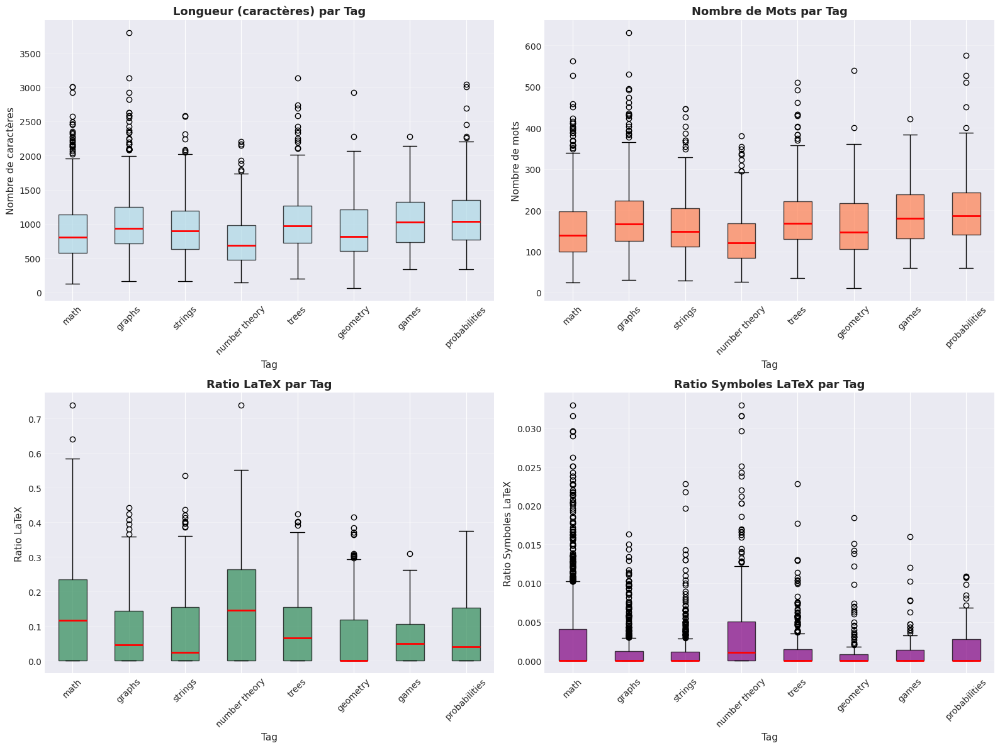


💡 Insight: Ces boxplots permettent de voir si certains tags sont associés
           à des textes plus longs, plus courts, ou avec plus de LaTeX


In [90]:
# Analyse par tag pour char_length
print_numeric_stats_by_tag(df, 'prob_desc_description_char_length', PRIORITY_TAGS, 'Longueur (caractères)')

# Boxplots par tag pour les différentes features
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Char length par tag
ax = axes[0, 0]
data_by_tag = []
labels = []
for tag in PRIORITY_TAGS:
    mask = df['tags'].apply(lambda tags: tag in tags if isinstance(tags, list) else False)
    tag_data = df[mask]['prob_desc_description_char_length'].dropna()
    if len(tag_data) > 0:
        data_by_tag.append(tag_data)
        labels.append(tag)
bp = ax.boxplot(data_by_tag, labels=labels, patch_artist=True,
                boxprops=dict(facecolor='lightblue', alpha=0.7),
                medianprops=dict(color='red', linewidth=2))
ax.set_xlabel('Tag', fontsize=11)
ax.set_ylabel('Nombre de caractères', fontsize=11)
ax.set_title('Longueur (caractères) par Tag', fontsize=13, fontweight='bold')
ax.tick_params(axis='x', rotation=45)
ax.grid(axis='y', alpha=0.3)

# Word count par tag
ax = axes[0, 1]
data_by_tag = []
labels = []
for tag in PRIORITY_TAGS:
    mask = df['tags'].apply(lambda tags: tag in tags if isinstance(tags, list) else False)
    tag_data = df[mask]['prob_desc_description_word_count'].dropna()
    if len(tag_data) > 0:
        data_by_tag.append(tag_data)
        labels.append(tag)
bp = ax.boxplot(data_by_tag, labels=labels, patch_artist=True,
                boxprops=dict(facecolor='coral', alpha=0.7),
                medianprops=dict(color='red', linewidth=2))
ax.set_xlabel('Tag', fontsize=11)
ax.set_ylabel('Nombre de mots', fontsize=11)
ax.set_title('Nombre de Mots par Tag', fontsize=13, fontweight='bold')
ax.tick_params(axis='x', rotation=45)
ax.grid(axis='y', alpha=0.3)

# LaTeX ratio par tag
ax = axes[1, 0]
data_by_tag = []
labels = []
for tag in PRIORITY_TAGS:
    mask = df['tags'].apply(lambda tags: tag in tags if isinstance(tags, list) else False)
    tag_data = df[mask]['prob_desc_description_latex_ratio'].dropna()
    if len(tag_data) > 0:
        data_by_tag.append(tag_data)
        labels.append(tag)
bp = ax.boxplot(data_by_tag, labels=labels, patch_artist=True,
                boxprops=dict(facecolor='seagreen', alpha=0.7),
                medianprops=dict(color='red', linewidth=2))
ax.set_xlabel('Tag', fontsize=11)
ax.set_ylabel('Ratio LaTeX', fontsize=11)
ax.set_title('Ratio LaTeX par Tag', fontsize=13, fontweight='bold')
ax.tick_params(axis='x', rotation=45)
ax.grid(axis='y', alpha=0.3)

# LaTeX symbols ratio par tag
ax = axes[1, 1]
data_by_tag = []
labels = []
for tag in PRIORITY_TAGS:
    mask = df['tags'].apply(lambda tags: tag in tags if isinstance(tags, list) else False)
    tag_data = df[mask]['prob_desc_description_latex_symbols_ratio'].dropna()
    if len(tag_data) > 0:
        data_by_tag.append(tag_data)
        labels.append(tag)
bp = ax.boxplot(data_by_tag, labels=labels, patch_artist=True,
                boxprops=dict(facecolor='purple', alpha=0.7),
                medianprops=dict(color='red', linewidth=2))
ax.set_xlabel('Tag', fontsize=11)
ax.set_ylabel('Ratio Symboles LaTeX', fontsize=11)
ax.set_title('Ratio Symboles LaTeX par Tag', fontsize=13, fontweight='bold')
ax.tick_params(axis='x', rotation=45)
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Insight: Ces boxplots permettent de voir si certains tags sont associés")
print("           à des textes plus longs, plus courts, ou avec plus de LaTeX")


### 7.3.6 Matrice de Corrélation des Features Numériques

**Objectif** : Identifier les corrélations entre toutes les features numériques.


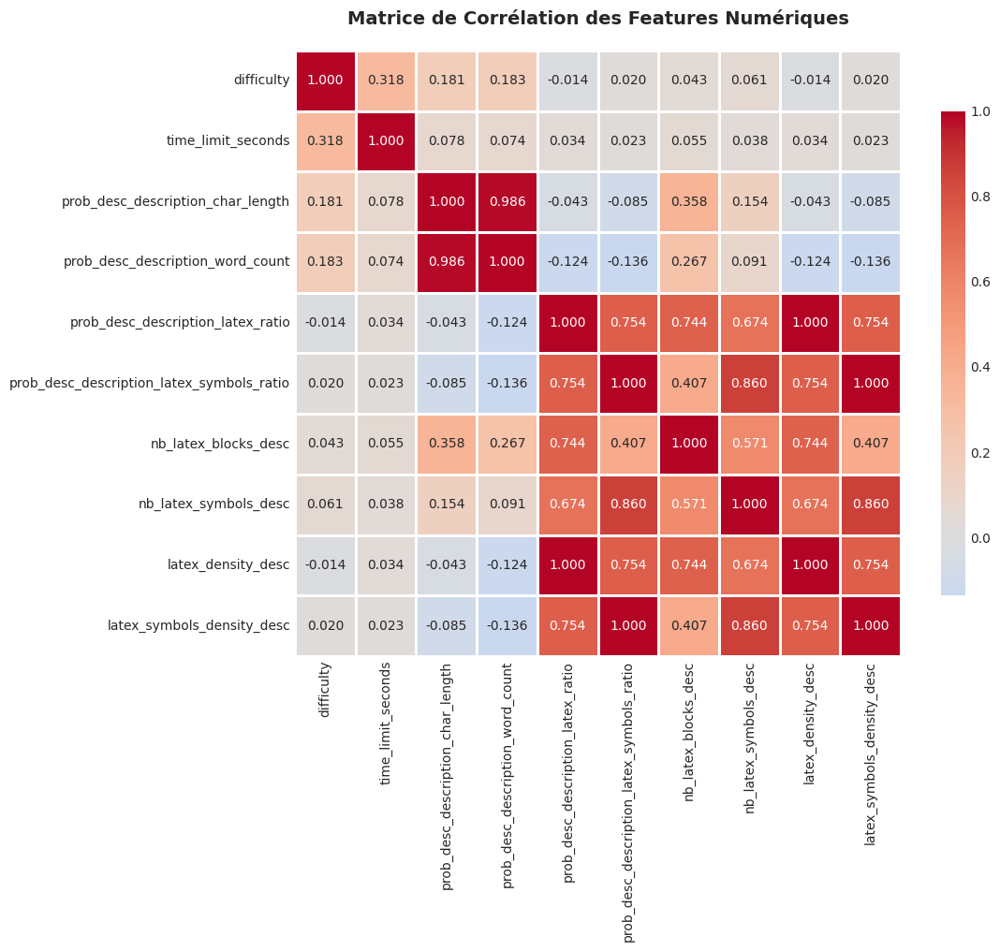


CORRÉLATIONS LES PLUS FORTES (|r| > 0.3)
  Variable 1                                 Variable 2                                  Corrélation
  ----------------------------------------   ----------------------------------------   ------------
  prob_desc_description_latex_ratio          latex_density_desc                                1.000
  prob_desc_description_latex_symbols_ratio   latex_symbols_density_desc                        1.000
  prob_desc_description_char_length          prob_desc_description_word_count                  0.986
  prob_desc_description_latex_symbols_ratio   nb_latex_symbols_desc                             0.860
  nb_latex_symbols_desc                      latex_symbols_density_desc                        0.860
  prob_desc_description_latex_ratio          prob_desc_description_latex_symbols_ratio          0.754
  prob_desc_description_latex_ratio          latex_symbols_density_desc                        0.754
  prob_desc_description_latex_symbols_ratio   

In [91]:
# Liste des features numériques à inclure dans la corrélation
numeric_features = [
    'difficulty',
    'time_limit_seconds',
    'prob_desc_description_char_length',
    'prob_desc_description_word_count',
    'prob_desc_description_latex_ratio',
    'prob_desc_description_latex_symbols_ratio',
    'nb_latex_blocks_desc',
    'nb_latex_symbols_desc',
    'latex_density_desc',
    'latex_symbols_density_desc'
]

# Visualisation de la matrice de corrélation
plot_correlation_matrix(df, numeric_features, figsize=(12, 10))

print("\n💡 Insight: Cette matrice permet d'identifier:")
print("   - Les features redondantes (corrélation forte > 0.8)")
print("   - Les features complémentaires (corrélation faible)")
print("   - Les relations inattendues entre variables")


## 8. Synthèse & Insights Clés

Résumé des principales découvertes de l'EDA avancée.


In [17]:
from IPython.display import Markdown

synthesis = """
### 🎯 Découvertes Principales

#### 1️⃣ **Langue** 
- Le dataset est **très homogène en anglais** (>98% sur toutes les colonnes)
- Quelques outliers linguistiques détectés (<2%) → à gérer en preprocessing

#### 2️⃣ **LaTeX**
- **Présence importante** dans `prob_desc_description` (présent dans ~40-60% des échantillons)
- **'number theory', 'math', 'probabilities'** : densité LaTeX élevée (formules complexes)
- **'strings', 'games'** : faible densité LaTeX (logique algorithmique)
- Symboles top : `\le`, `\ldots`, `\cdot`, `\frac` → features discriminantes

#### 3️⃣ **Char N-grams (3-5)**
- Capturent des **patterns algorithmiques précis** : `gcd`, `mod`, `dfs`, `bfs`, `mst`, `lcm`
- Signaux mathématiques : `binom`, `Pr(`, `sum`
- **Surreprésentation forte par tag** (discriminants) → excellent signal pour les classifiers

#### 4️⃣ **Nuages de Mots par Colonne**
- **`prob_desc_description`** : langage naturel avec mots-clés domaine
- **`prob_desc_input_spec`** : structure de données (`array`, `integer`, `list`, `matrix`)
- **`prob_desc_output_spec`** : types de réponse (`minimum`, `maximum`, `number`, `print`)
- **`prob_desc_notes`** : clarifications et contraintes (`note`, `example`, `assume`)

#### 5️⃣ **Document Unifié**
- Concaténation réussie avec tokens spéciaux `[DESC]`, `[IN]`, `[OUT]`, `[NOTES]`, `[SAMPLE_IN/OUT]`
- Longueur moyenne : ~2000-3000 caractères
- **Prêt pour TF-IDF / word embeddings / transformers**

#### 6️⃣ **Distribution des Tags**
- **Déséquilibre fort** : `math` (1409) vs `probabilities` (92) → ratio 15:1
- 53.8% des problèmes ont **au moins un tag prioritaire**
- Parmi ces problèmes avec tag prioritaire : **75.4% mono-tag, 24.6% multi-tag**
- **Tous les échantillons conservés** (y compris sans tags prioritaires) → négatifs utiles

---

### 🚀 Prochaines Étapes

#### 📌 Feature Engineering
1. **TF-IDF** (1-3 grams) sur `unified_document` + colonnes individuelles
2. **Char n-grams TF-IDF** (3-5) sur `prob_desc_description`
3. **LaTeX features** : densité, nb symboles, symboles spécifiques (one-hot/count)
4. **Code features** : AST patterns, complexity metrics, imports
5. **Méta-features** : longueur, ratio LaTeX, presence flags

#### 📌 Modélisation Multi-label
1. **Binary Relevance** : 8 classifiers indépendants (baseline)
2. **Classifier Chains** : capture des dépendances
3. **Label Powerset** (si faisable) : traite chaque combinaison
4. **Ensembles** : LightGBM, XGBoost avec multi-label wrapper

#### 📌 Validation
1. **Stratified K-Fold** pour multi-label (iterstrat)
2. **GroupSplit** sur near-duplicates (éviter data leakage)
3. **Métriques** : F1-micro, F1-macro, F1 par tag, Hamming Loss, Subset Accuracy

#### 📌 Gestion du Déséquilibre
1. **Class weights** pour les tags rares
2. **Oversampling** (MLSMOTE si nécessaire, avec précaution)
3. **Threshold tuning** par tag (optimiser seuil de classification)

---

### ✅ Points Forts de cette EDA

✔️ **Analyses textuelles multi-colonnes complètes**  
✔️ **Extraction LaTeX robuste** (séparation texte nettoyé + features)  
✔️ **Char n-grams** pour patterns courts discriminants  
✔️ **Document unifié** prêt pour vectorisation  
✔️ **Conservation de tous les échantillons** (y compris négatifs)  
✔️ **Distribution des tags analysée** (mono/multi-tag)  
✔️ **Détection langue** (homogénéité confirmée)  

---

### 📝 À Retenir

> **Ce dataset est un problème de classification multi-label avec déséquilibre important.**  
> Les features textuelles (TF-IDF, char n-grams) + LaTeX + code patterns seront cruciaux.  
> La stratification multi-label et le GroupSplit sur near-duplicates sont essentiels pour une validation robuste.

**Prêt pour la phase de modélisation ! 🚀**
"""

display(Markdown(synthesis))



### 🎯 Découvertes Principales

#### 1️⃣ **Langue** 
- Le dataset est **très homogène en anglais** (>98% sur toutes les colonnes)
- Quelques outliers linguistiques détectés (<2%) → à gérer en preprocessing

#### 2️⃣ **LaTeX**
- **Présence importante** dans `prob_desc_description` (présent dans ~40-60% des échantillons)
- **'number theory', 'math', 'probabilities'** : densité LaTeX élevée (formules complexes)
- **'strings', 'games'** : faible densité LaTeX (logique algorithmique)
- Symboles top : `\le`, `\ldots`, `\cdot`, `




rac` → features discriminantes

#### 3️⃣ **Char N-grams (3-5)**
- Capturent des **patterns algorithmiques précis** : `gcd`, `mod`, `dfs`, `bfs`, `mst`, `lcm`
- Signaux mathématiques : `binom`, `Pr(`, `sum`
- **Surreprésentation forte par tag** (discriminants) → excellent signal pour les classifiers

#### 4️⃣ **Nuages de Mots par Colonne**
- **`prob_desc_description`** : langage naturel avec mots-clés domaine
- **`prob_desc_input_spec`** : structure de données (`array`, `integer`, `list`, `matrix`)
- **`prob_desc_output_spec`** : types de réponse (`minimum`, `maximum`, `number`, `print`)
- **`prob_desc_notes`** : clarifications et contraintes (`note`, `example`, `assume`)

#### 5️⃣ **Document Unifié**
- Concaténation réussie avec tokens spéciaux `[DESC]`, `[IN]`, `[OUT]`, `[NOTES]`, `[SAMPLE_IN/OUT]`
- Longueur moyenne : ~2000-3000 caractères
- **Prêt pour TF-IDF / word embeddings / transformers**

#### 6️⃣ **Distribution des Tags**
- **Déséquilibre fort** : `math` (1409) vs `probabilities` (92) → ratio 15:1
- 53.8% des problèmes ont **au moins un tag prioritaire**
- Parmi ces problèmes avec tag prioritaire : **75.4% mono-tag, 24.6% multi-tag**
- **Tous les échantillons conservés** (y compris sans tags prioritaires) → négatifs utiles

---

### 🚀 Prochaines Étapes

#### 📌 Feature Engineering
1. **TF-IDF** (1-3 grams) sur `unified_document` + colonnes individuelles
2. **Char n-grams TF-IDF** (3-5) sur `prob_desc_description`
3. **LaTeX features** : densité, nb symboles, symboles spécifiques (one-hot/count)
4. **Code features** : AST patterns, complexity metrics, imports
5. **Méta-features** : longueur, ratio LaTeX, presence flags

#### 📌 Modélisation Multi-label
1. **Binary Relevance** : 8 classifiers indépendants (baseline)
2. **Classifier Chains** : capture des dépendances
3. **Label Powerset** (si faisable) : traite chaque combinaison
4. **Ensembles** : LightGBM, XGBoost avec multi-label wrapper

#### 📌 Validation
1. **Stratified K-Fold** pour multi-label (iterstrat)
2. **GroupSplit** sur near-duplicates (éviter data leakage)
3. **Métriques** : F1-micro, F1-macro, F1 par tag, Hamming Loss, Subset Accuracy

#### 📌 Gestion du Déséquilibre
1. **Class weights** pour les tags rares
2. **Oversampling** (MLSMOTE si nécessaire, avec précaution)
3. **Threshold tuning** par tag (optimiser seuil de classification)

---

### ✅ Points Forts de cette EDA

✔️ **Analyses textuelles multi-colonnes complètes**  
✔️ **Extraction LaTeX robuste** (séparation texte nettoyé + features)  
✔️ **Char n-grams** pour patterns courts discriminants  
✔️ **Document unifié** prêt pour vectorisation  
✔️ **Conservation de tous les échantillons** (y compris négatifs)  
✔️ **Distribution des tags analysée** (mono/multi-tag)  
✔️ **Détection langue** (homogénéité confirmée)  

---

### 📝 À Retenir

> **Ce dataset est un problème de classification multi-label avec déséquilibre important.**  
> Les features textuelles (TF-IDF, char n-grams) + LaTeX + code patterns seront cruciaux.  
> La stratification multi-label et le GroupSplit sur near-duplicates sont essentiels pour une validation robuste.

**Prêt pour la phase de modélisation ! 🚀**


Merci pour toutes ces analyses : J'aimerais maintenant qu'on pense à la suite et avoir des fonctions claires permettant de faire les différents préprocessings. L'idée est notamment d'avoir un notebook sans visualisation qui transformerait le dataframe en appelant les fonctions les unes apres les autres. Sur ce notebook on pourra notamment initier les travaux avec Tf-IDFs et Embeddings (on en reparlera avant de se lancer)

La plupart des traitements sont déjà disponible dans le notebook

Mettre en évidence les transformations de données que l'on a choisi et les preprocessings nécessaires :
- conserve toutes les observations même qui n'ont pas de tags prioritaires
- nouvelle colonne de la target avec uniquement les tags prioritaires
- nettoyage des notes ("NoteIN" --> "Note: In")
- traduction des différents textes brutes avec latex
- Identifier les énoncés semblables et n'en conserver que un
- Faire le retraitement sur "prob_desc_time_limit" pour les transformer en float
- Difficulty : Traiter les difficultés -1 en missing
- Séparation texte clean et Latex
- Concaténation de tous les textes cleans pour embedddings / tf-idf
- Création de stats sur le Latex et identification des différents symbols

Avant de passer à la création du nouveau notebook, as-tu des questions ? Des retours à me faire sur ce que je demande ? J'aimerais également que tu me proposes une gestion des valeurs manquantes.

Penses-tu qu'il est utile de faire des listes de mots type (keywords) par labels pour en faire une feature de présence. Sachant qu'on utilsera par la suite un tf idf ou embedding.

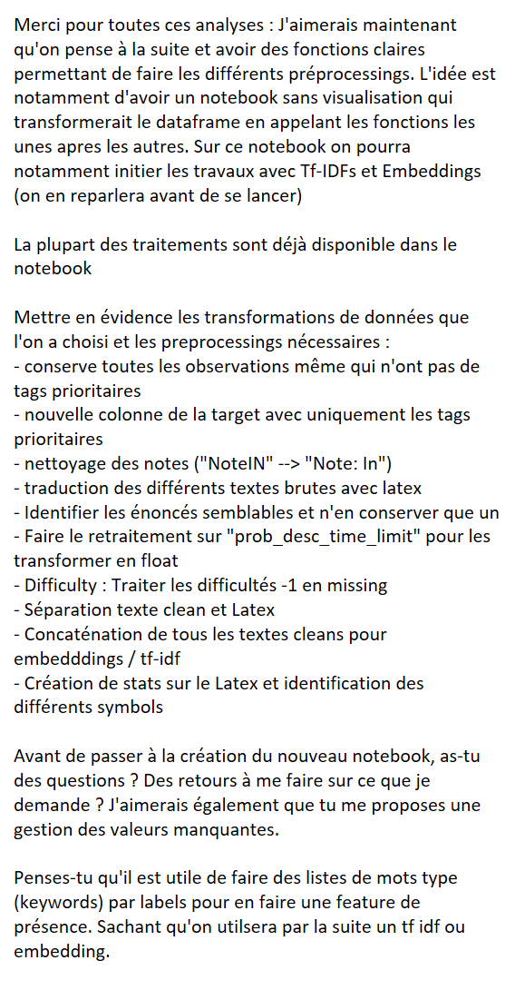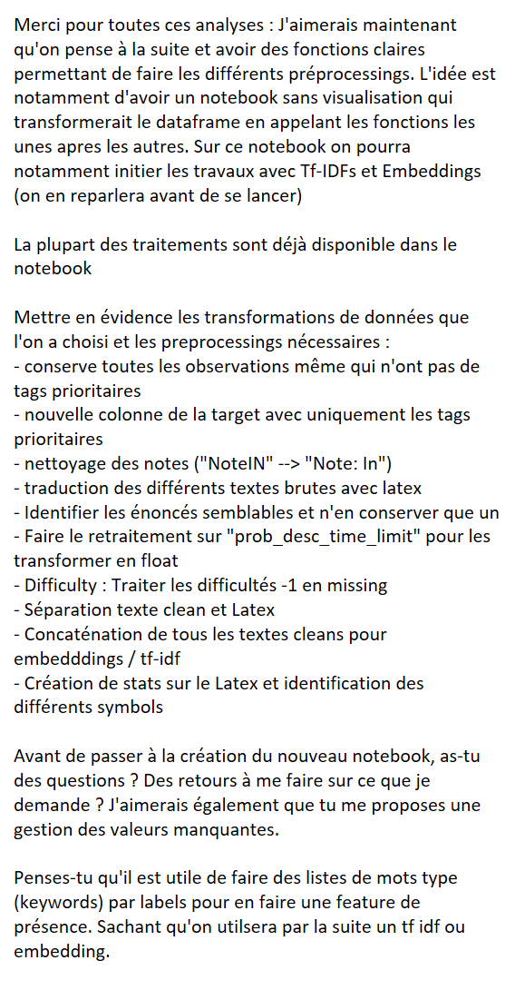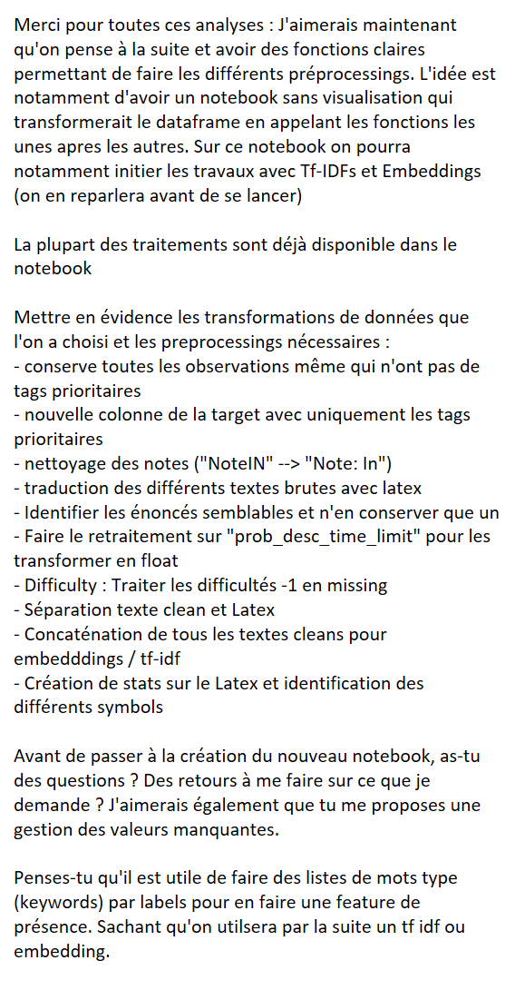